# Markdown - Understanding of Explainability in Time Series Forecasting

In [2]:
import yfinance as yf
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from IPython.display import display, Javascript

import random
random.seed(1)

from IPython.core.magic import register_cell_magic

@register_cell_magic
def skip(line, cell):
    return

# Import Stocks HIHI 

The following stocks will be imported to be subject to analysis:
- S&P500 (^GSPC)
- NVIDIA (NVDA)
- Apple (AAPL)
- Microsoft (MSFT)

In [4]:
import matplotlib.pyplot as plt

def get_stock_data(symbol, period="1y"):
    """
    Fetch the latest stock price data for a given stock symbol.
    
    Parameters:
        symbol (str): Stock ticker symbol (e.g., "AAPL" for Apple, "TSLA" for Tesla, "^GSPC" for S&P 500).
        period (str): Time period for historical data (default: "1y" for 1 year).
        
    Returns:
        pd.DataFrame: DataFrame containing historical stock prices.
    """
    # Download stock data
    stock_data = yf.download(symbol, period=period)
    
    # Drop missing values
    stock_data.dropna(inplace=True)
    
    return stock_data

def plot_stock_data(symbol, period="1y"):
    """
    Fetch and plot the latest closing price data for a given stock.
    
    Parameters:
        symbol (str): Stock ticker symbol.
        period (str): Time period for historical data.
    """
    # Get stock data
    stock_data = get_stock_data(symbol, period)
    
    # Extract dates and closing prices
    dates = stock_data.index
    close_prices = stock_data["Close"]
    
    # Plot the closing prices
    plt.figure(figsize=(12, 6))
    plt.plot(dates, close_prices, label=f"{symbol} Close Price", color="blue")
    
    # Customize the plot
    plt.title(f"{symbol} Closing Prices ({period})")
    plt.xlabel("Date")
    plt.ylabel("Close Price (USD)")
    plt.legend()
    plt.grid(True)
    plt.xticks(rotation=45)
    
    # Show the plot
    plt.show()
    
    # Return the data
    return stock_data

## Index: **S&P500 (GSPC)**

This piece of code retrieves historical stock market data for the S&P 500 index (`^GSPC`) using the `yfinance` (Yahoo Finance) library. The goal is to retrieve 1-year and 5-years of stock market data to analyze historical trends and patterns. The code also tries to ensure that any missing (NaN) values in the dataset are removed, preventing errors in further analysis.

In [7]:
# Now, let's retrieve the S&P 500 data of the past 5 years using yfinance

# Specify stock symbol and date range
sp500_symbol = '^GSPC'
sp500_data_1y = yf.download(sp500_symbol, period="1y")
sp500_data_5y = yf.download(sp500_symbol, period="5y")

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


In [8]:
sp500_data_1y.dropna(inplace=True)
sp500_data_5y.dropna(inplace=True)

[*********************100%***********************]  1 of 1 completed


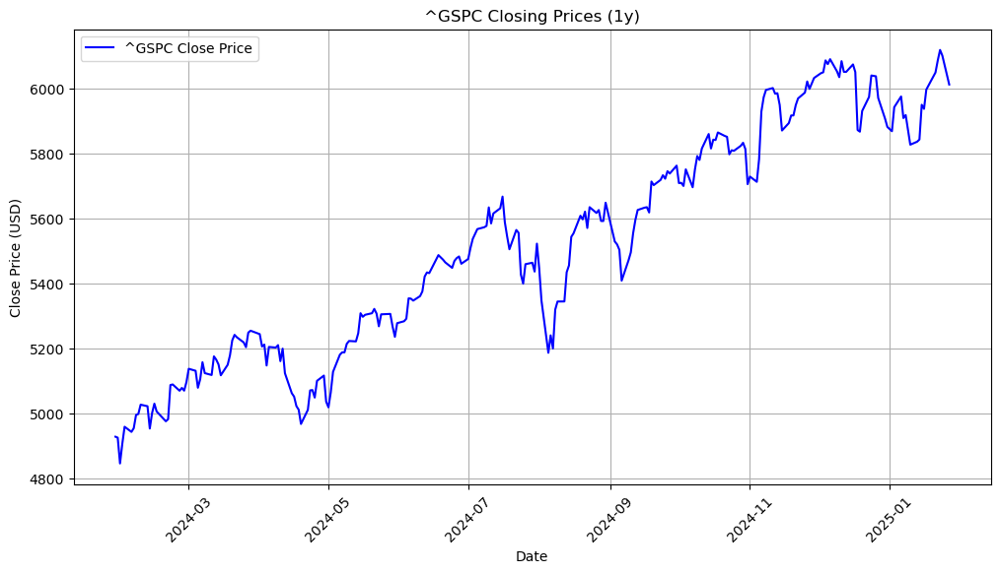

Price,Close,High,Low,Open,Volume
Ticker,^GSPC,^GSPC,^GSPC,^GSPC,^GSPC
Date,,,,,
2024-01-29,4927.930176,4929.310059,4887.399902,4892.950195,3525160000
2024-01-30,4924.970215,4931.089844,4916.270020,4925.890137,3836130000
2024-01-31,4845.649902,4906.750000,4845.149902,4899.189941,4696120000
2024-02-01,4906.189941,4906.970215,4853.520020,4861.109863,4386090000
2024-02-02,4958.609863,4975.290039,4907.990234,4916.060059,3974350000
...,...,...,...,...,...
2025-01-21,6049.240234,6051.509766,6006.879883,6014.120117,4702920000
2025-01-22,6086.370117,6100.810059,6076.129883,6081.390137,4323040000


In [9]:
plot_stock_data(sp500_symbol, period="1y")

[*********************100%***********************]  1 of 1 completed


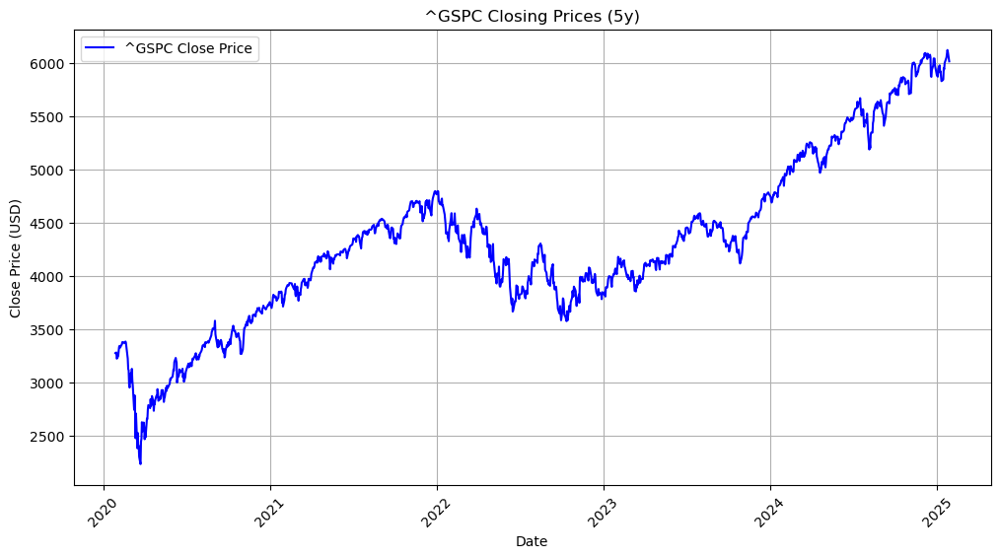

Price,Close,High,Low,Open,Volume
Ticker,^GSPC,^GSPC,^GSPC,^GSPC,^GSPC
Date,,,,,
2020-01-28,3276.239990,3285.780029,3253.219971,3255.350098,3531570000
2020-01-29,3273.399902,3293.469971,3271.889893,3289.459961,3600250000
2020-01-30,3283.659912,3285.909912,3242.800049,3256.449951,3790350000
2020-01-31,3225.520020,3282.330078,3214.679932,3282.330078,4529700000
2020-02-03,3248.919922,3268.439941,3235.659912,3235.659912,3760460000
...,...,...,...,...,...
2025-01-21,6049.240234,6051.509766,6006.879883,6014.120117,4702920000
2025-01-22,6086.370117,6100.810059,6076.129883,6081.390137,4323040000


In [10]:
plot_stock_data(sp500_symbol, period="5y")

## Stock: **NVDIA (NVDA)**

The code below fetches historical stock data for a specified stock symbol (`NVDA` in this case) using the `yfinance` library.

In [13]:
# Specify stock symbol and date range
nvidia_symbol = 'NVDA'
# Fetch historical stock data
nvidia_data_1y = yf.download(nvidia_symbol,  period="1y")
nvidia_data_5y = yf.download(nvidia_symbol, period="5y")

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


In [14]:
nvidia_data_1y.dropna(inplace=True)
nvidia_data_5y.dropna(inplace=True)

[*********************100%***********************]  1 of 1 completed


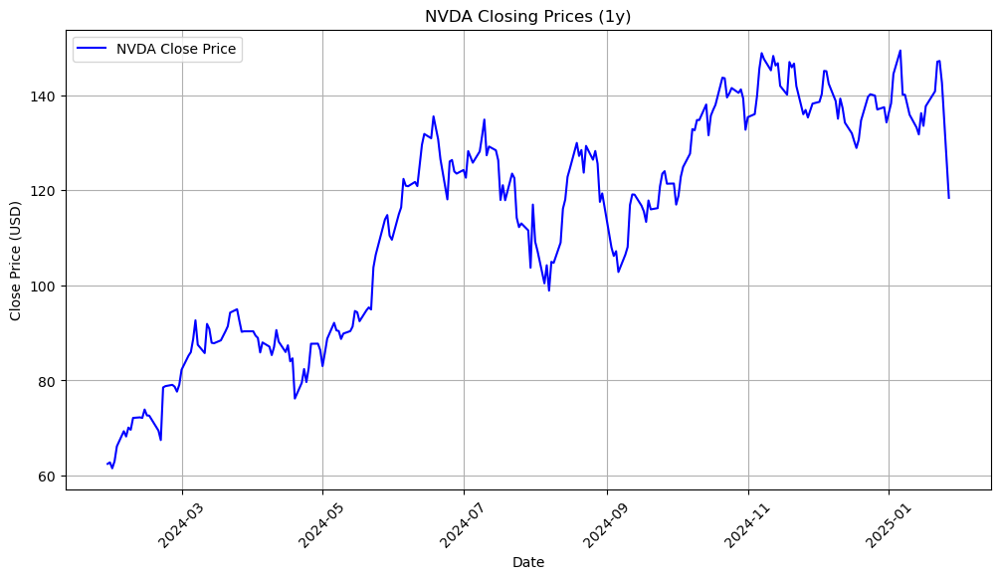

Price,Close,High,Low,Open,Volume
Ticker,NVDA,NVDA,NVDA,NVDA,NVDA
Date,,,,,
2024-01-29,62.447296,62.471288,60.889739,61.214644,348733000
2024-01-30,62.756203,63.475001,62.242348,62.882170,410735000
2024-01-31,61.509563,62.251354,60.682798,61.422586,453795000
2024-02-01,63.009136,63.173091,61.632528,62.082397,369146000
2024-02-02,66.141251,66.581121,63.671946,63.955866,476578000
...,...,...,...,...,...
2025-01-21,140.830002,141.830002,137.089996,139.160004,197749000
2025-01-22,147.070007,147.789993,143.669998,144.660004,237651400


In [15]:
plot_stock_data(nvidia_symbol, period="1y")

[*********************100%***********************]  1 of 1 completed


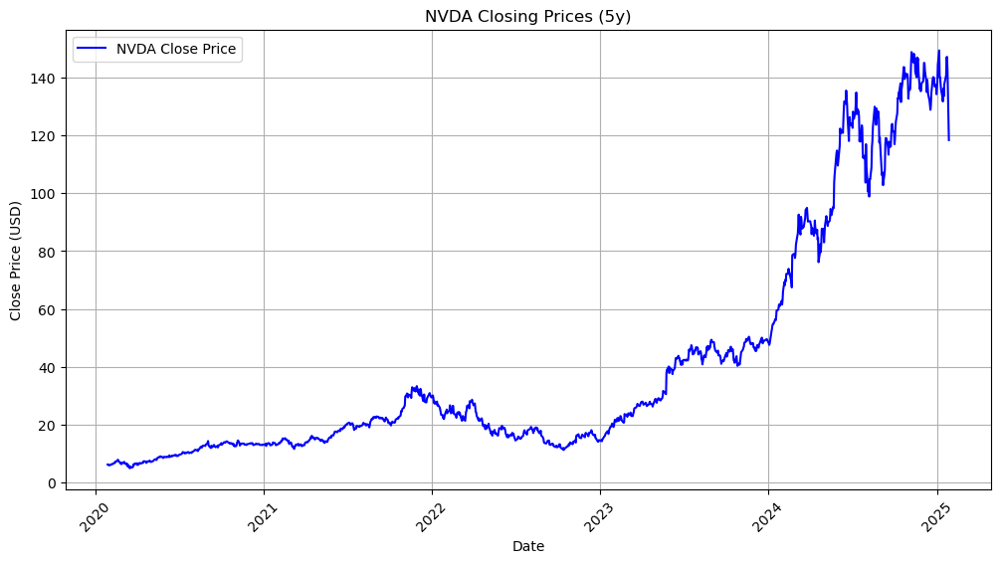

Price,Close,High,Low,Open,Volume
Ticker,NVDA,NVDA,NVDA,NVDA,NVDA
Date,,,,,
2020-01-28,6.173369,6.205734,5.992627,6.045904,310976000
2020-01-29,6.112874,6.195030,6.073041,6.158931,258848000
2020-01-30,6.119594,6.133038,5.960013,6.015032,290504000
2020-01-31,5.886074,6.085737,5.844249,6.073787,370420000
2020-02-03,5.983168,6.002586,5.861677,5.867901,255564000
...,...,...,...,...,...
2025-01-21,140.830002,141.830002,137.089996,139.160004,197749000
2025-01-22,147.070007,147.789993,143.669998,144.660004,237651400


In [16]:
plot_stock_data(nvidia_symbol, period="5y")

## Stock: **Apple (AAPL)**

In [18]:
# Specify stock symbol and date range
aapl_symbol = 'AAPL'
# Fetch historical stock data
aapl_data_1y = yf.download(aapl_symbol,  period="1y")
aapl_data_5y = yf.download(aapl_symbol,  period="5y")

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


In [19]:
aapl_data_1y.dropna(inplace=True)
aapl_data_5y.dropna(inplace=True)

[*********************100%***********************]  1 of 1 completed


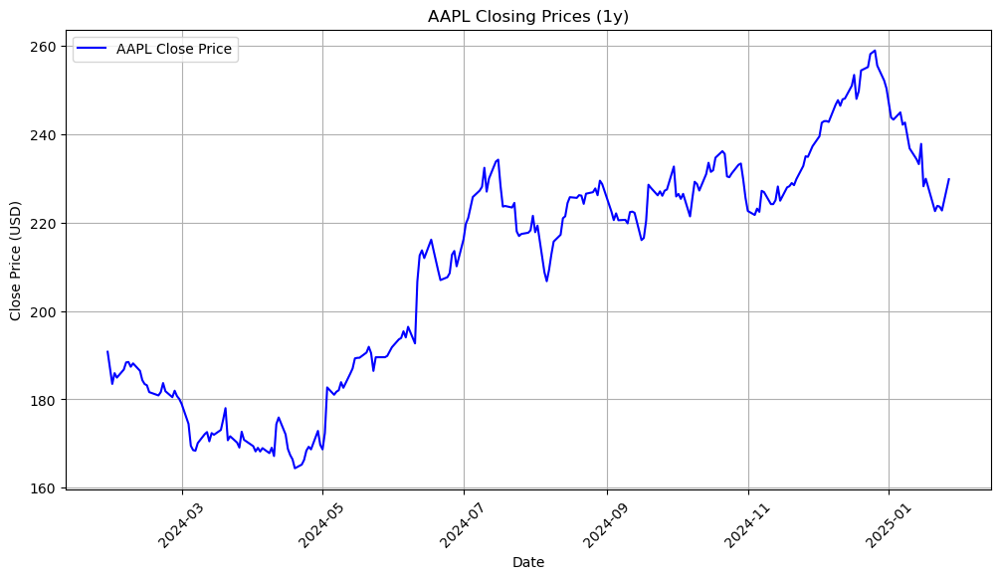

Price,Close,High,Low,Open,Volume
Ticker,AAPL,AAPL,AAPL,AAPL,AAPL
Date,,,,,
2024-01-29,190.795273,191.262983,188.655761,191.073907,47145600
2024-01-30,187.123276,190.864955,186.556062,190.009147,55859400
2024-01-31,183.501022,186.187872,183.451278,186.128151,55467800
2024-02-01,185.949051,186.038609,182.923878,183.093047,64885400
2024-02-02,184.943954,186.416735,178.376125,178.983151,102518000
...,...,...,...,...,...
2025-01-21,222.639999,224.419998,219.380005,224.000000,98070400
2025-01-22,223.830002,224.119995,219.789993,219.789993,64126500


In [20]:
plot_stock_data(aapl_symbol, period="1y")

[*********************100%***********************]  1 of 1 completed


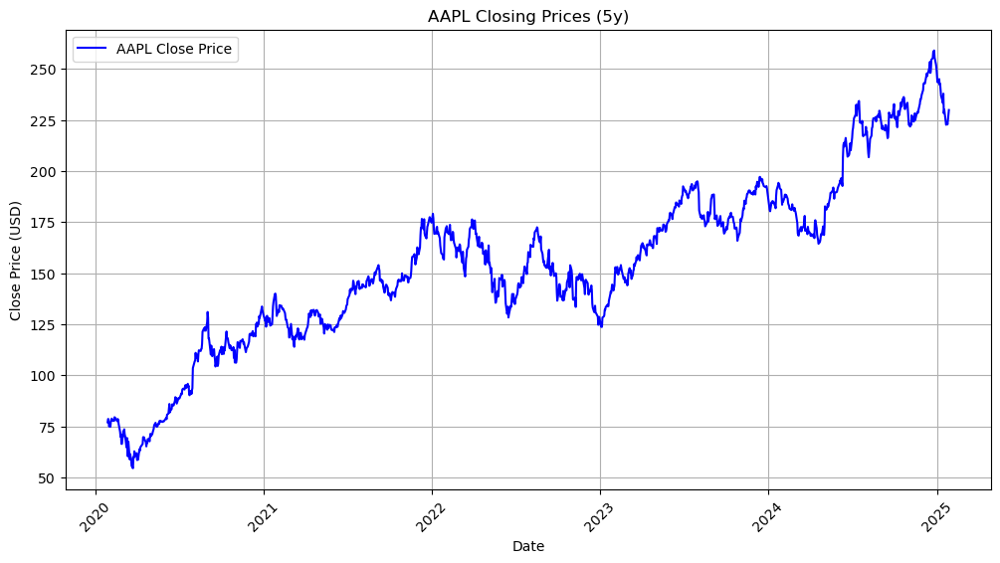

Price,Close,High,Low,Open,Volume
Ticker,AAPL,AAPL,AAPL,AAPL,AAPL
Date,,,,,
2020-01-28,76.998741,77.170822,75.665702,75.765075,162234000
2020-01-29,78.610474,79.461197,77.893059,78.637138,216229200
2020-01-30,78.496574,78.549896,77.255638,77.689483,126743200
2020-01-31,75.016129,78.208145,74.720436,77.783997,199588400
2020-02-03,74.810120,75.980767,73.249252,73.753380,173788400
...,...,...,...,...,...
2025-01-21,222.639999,224.419998,219.380005,224.000000,98070400
2025-01-22,223.830002,224.119995,219.789993,219.789993,64126500


In [21]:
plot_stock_data(aapl_symbol, period="5y")

## Stock: **Microsoft (MSFT)**

In [23]:
# Specify stock symbol and date range
msft_symbol = 'MSFT'
# Fetch historical stock data
msft_data_1y = yf.download(msft_symbol,  period="1y")
msft_data_5y = yf.download(msft_symbol,  period="5y")

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


In [24]:
msft_data_1y.dropna(inplace=True)
msft_data_5y.dropna(inplace=True)

[*********************100%***********************]  1 of 1 completed


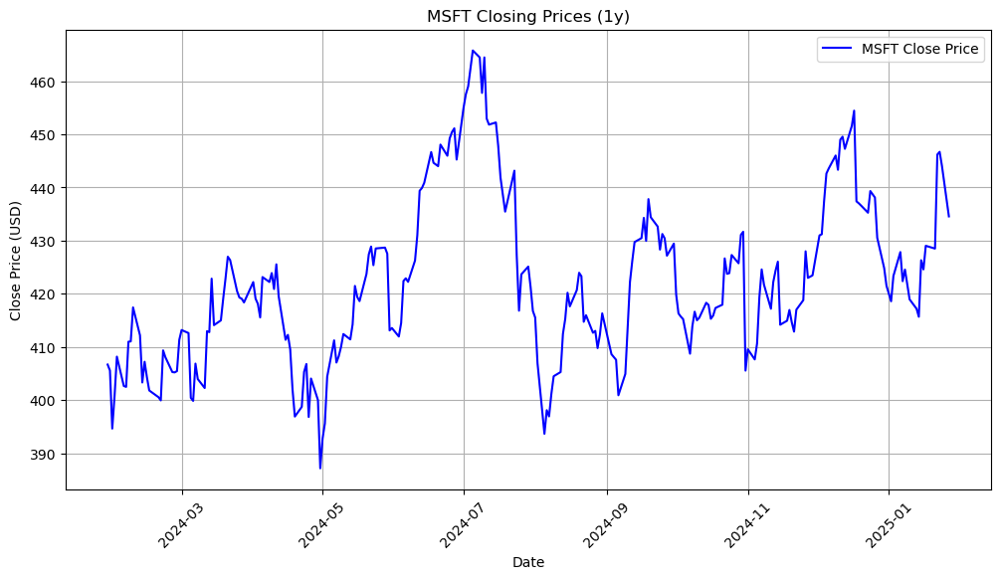

Price,Close,High,Low,Open,Volume
Ticker,MSFT,MSFT,MSFT,MSFT,MSFT
Date,,,,,
2024-01-29,406.678864,406.936943,401.328856,403.046026,24510200
2024-01-30,405.557251,409.984138,403.433151,409.200024,33477600
2024-01-31,394.629028,412.237377,394.261779,403.939412,47871100
2024-02-01,400.782990,404.971668,398.817675,398.847451,30657700
2024-02-02,408.167755,409.587134,400.564607,400.812752,28245000
...,...,...,...,...,...
2025-01-21,428.500000,430.899994,425.600006,430.200012,26085700
2025-01-22,446.200012,447.269989,436.000000,437.559998,27803800


In [25]:
plot_stock_data(msft_symbol, period="1y")

[*********************100%***********************]  1 of 1 completed


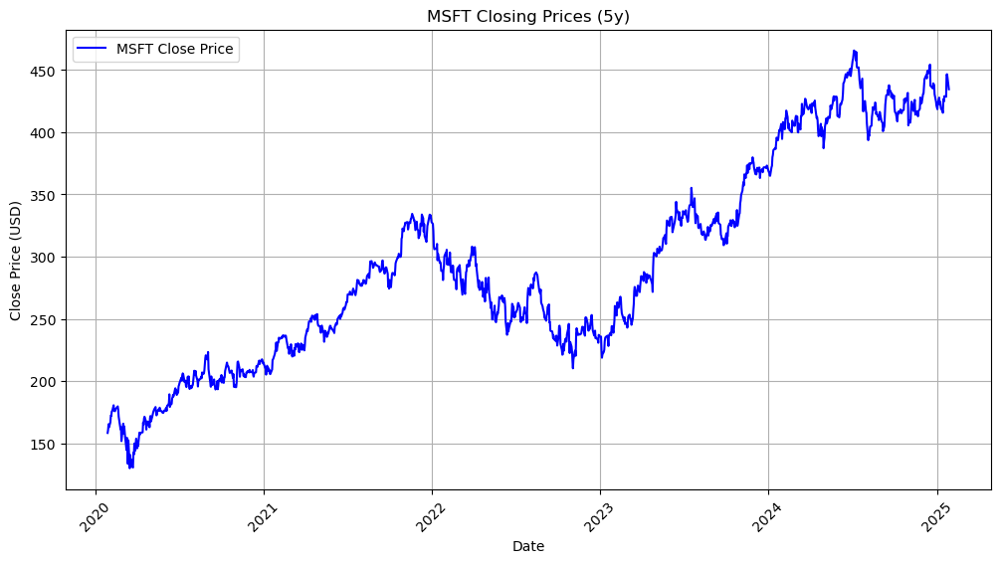

Price,Close,High,Low,Open,Volume
Ticker,MSFT,MSFT,MSFT,MSFT,MSFT
Date,,,,,
2020-01-28,158.260132,158.547066,155.974132,156.653228,24899900
2020-01-29,160.727829,161.406940,158.480097,160.536535,34754500
2020-01-30,165.261536,166.476276,163.358125,166.476276,51597500
2020-01-31,162.822510,164.898081,162.200800,164.716361,36142700
2020-02-03,166.791977,166.906751,162.985153,163.013847,30107000
...,...,...,...,...,...
2025-01-21,428.500000,430.899994,425.600006,430.200012,26085700
2025-01-22,446.200012,447.269989,436.000000,437.559998,27803800


In [26]:
plot_stock_data(msft_symbol, period="5y")

# Returns

In this section, we calculate the returns based on the 'Close' column retrieved by `yfinance`. data['Close'].pct_change() * 100: Computes daily percentage return based on the closing price.

*.pct_change()* calculates the relative change between consecutive days.
Multiplying by 100 converts it into a percentage format.

In [29]:
# Function to calculate returns and restructure the DataFrame
def add_returns_column(data, ticker):
    data['Return'] = data['Close'].pct_change() * 100  # Calculate daily returns in percentage
    data = data[['Return', 'Close', 'High', 'Low', 'Open', 'Volume']]  # Reorder columns
    data.columns = [
        'Return', f'{ticker}_Close', f'{ticker}_High', f'{ticker}_Low', f'{ticker}_Open', f'{ticker}_Volume'
    ]  # Rename columns to include the ticker
    return data

# Add returns column and restructure the DataFrames
sp500_data_1y = add_returns_column(sp500_data_1y, 'SP500')
sp500_data_5y = add_returns_column(sp500_data_5y, 'SP500')

nvidia_data_1y = add_returns_column(nvidia_data_1y, 'NVDA')
nvidia_data_5y = add_returns_column(nvidia_data_5y, 'NVDA')

aapl_data_1y = add_returns_column(aapl_data_1y, 'AAPL')
aapl_data_5y = add_returns_column(aapl_data_5y, 'AAPL')

msft_data_1y = add_returns_column(msft_data_1y, 'MSFT')
msft_data_5y = add_returns_column(msft_data_5y, 'MSFT')

# Example: Display the first few rows of the 1-year S&P 500 data
print(sp500_data_1y.head())

              Return  SP500_Close   SP500_High    SP500_Low   SP500_Open  \
Date                                                                       
2024-01-29       NaN  4927.930176  4929.310059  4887.399902  4892.950195   
2024-01-30 -0.060065  4924.970215  4931.089844  4916.270020  4925.890137   
2024-01-31 -1.610574  4845.649902  4906.750000  4845.149902  4899.189941   
2024-02-01  1.249369  4906.189941  4906.970215  4853.520020  4861.109863   
2024-02-02  1.068445  4958.609863  4975.290039  4907.990234  4916.060059   

            SP500_Volume  
Date                      
2024-01-29    3525160000  
2024-01-30    3836130000  
2024-01-31    4696120000  
2024-02-01    4386090000  
2024-02-02    3974350000  


Now that we know all the columns, let's briefly assess what every column means:
- `Return`: Shows the daily percentage change in closing price.
- `Close`: The closing price for each trading day.
- `Hig` & `Low`: The highest and lowest prices reached during the trading day.
- `Open`: The opening price of the S&P 500 for that day.
- `Volume`: The trading volume (number of shares traded that day). High volume suggests strong market activity.

We will use the **`Return`** column for assessment.

# Creation of Lagged Features

We want to make a simple dataframe where we can compare different time points against each other by having multiple columns (features or "lags") which consists of t-1, t-2 etc. I made a function where I could provide the number of lags we want to encapsulate it will make the defined matrix necessary.

The `create_lag_features` function generates lagged features for time series data, which are crucial for tasks like forecasting or regression. It takes a DataFrame data with a `Return` column and an integer `lags` indicating the number of lagged steps to include. The function sorts the data in descending order (most recent data first) and initializes a new DataFrame, where the current values (t) are directly assigned from the Close column. In the loop, for each lag `i` from 1 to `lags`, it creates a new column `t-i` using `data['Return'].shift(-i)`. The negative shift ensures that earlier values (lagged values) move upward to align with the current index, consistent with the descending order. For example, `t-1` represents the value one step before, and `t-2` represents the value two steps before. Once all lagged features are created, rows where any of the lagged columns contain `NaN` (due to insufficient earlier data) are dropped, ensuring the output DataFrame is clean and ready for modeling. This setup allows the inclusion of historical values as predictors for future predictions.

In [34]:
def create_lag_features(data, lags):
    """
    Create lag features for the given time series data.
    Parameters:
        data (pd.DataFrame): Original stock data
        lags (int): Number of lag days to include
    Returns:
        pd.DataFrame: DataFrame with lag features
    """

    # Sort data by date in descending order
    data = data.sort_index(ascending=False)
    
    # Create lagged features
    lagged_data = pd.DataFrame(index=data.index)
    lagged_data['t'] = data['Return']
    for i in range(1, lags + 1):
        lagged_data[f't-{i}'] = data['Return'].shift(-i)  # Use negative shift for descending order

    # Drop rows where all lagged values are NaN
    lagged_data.dropna(subset=[f't-{i}' for i in range(1, lags + 1)], inplace=True)

    return lagged_data

Let's take some examples to view how the matrices are constructed with the data so we can see whether it is done correctly. This is done for 6 lags (`t-1`, `t-2`, ..., `t-6`) and one can also see the output column y or in this case we refer to `t`. Results can be seen below.

In [36]:
create_lag_features(msft_data_1y, 6)

,t,t-1,t-2,t-3,t-4,t-5,t-6
Date,,,,,,,
2025-01-27,-2.139351,-0.593225,0.114294,4.130691,-0.123534,1.048097,-0.405811
2025-01-24,-0.593225,0.114294,4.130691,-0.123534,1.048097,-0.405811,2.559719
2025-01-23,0.114294,4.130691,-0.123534,1.048097,-0.405811,2.559719,-0.364340
2025-01-22,4.130691,-0.123534,1.048097,-0.405811,2.559719,-0.364340,-0.420100
2025-01-21,-0.123534,1.048097,-0.405811,2.559719,-0.364340,-0.420100,-1.321365
...,...,...,...,...,...,...,...
2024-02-13,-2.152864,-1.257876,1.555138,0.014495,2.111025,-0.039443,-1.354506
2024-02-12,-1.257876,1.555138,0.014495,2.111025,-0.039443,-1.354506,1.842585
2024-02-09,1.555138,0.014495,2.111025,-0.039443,-1.354506,1.842585,1.559429


In this case, `t` can be seen as the **`y` (target / output)**, where the model is trained towards. `t-1` ... `t-6` are the **`X's` (inputs)** of the model. These will be used to train the model and identify relationships. Neural networks would process this data as follows:

- **Feature Input**: Each row (a single observation) is treated as an input vector where `t`, `t-1`, ..., `t-6` are features. For a fully connected network, all features are considered together to capture patterns.
- **Learning Temporal Patterns**: Neural networks, especially recurrent neural networks (RNNs) or long short-term memory (LSTM) networks, are well-suited for sequential data. These architectures can model dependencies across time steps (lags), learning patterns like momentum, reversals, or stagnation over time.
- **Weights and Relationships**: Neural networks assign weights to each lagged feature, indicating its importance for prediction (For example, if `t-1` (the most recent lag) consistently has a stronger relationship with `t` than `t-6`, the model will learn to emphasize `t-1` more.). 
- **Feature Interactions**: Neural networks can capture nonlinear interactions between the features. For instance, the combined influence of `t-2` and `t-3` may indicate a certain price movement, even if those lags individually don't.

# Stock(s) Analysis with LPD (Multiple Lags) - Using MLP

We do an analysis of various stocks defined earlier (S&P500, NVIDIA, Apple, Microsoft) with the LPD approach defined by Branka (see https://arxiv.org/abs/2212.02906). For this, we defined a function `calculate_lpd_nn_by_lag`. This function uses a neural network (**MLPRegressor**) to analyze the impact of different time-lagged input features on the predicted output over time. It trains the neural network using lagged inputs and output values, then extracts the contributions (sensitivities) of each lag to the predictions. Settings of the neural net:
- \# input neurons defined by the number of lags given as input.
- 1 hidden layer with 100 hidden neurons.
- Limiting the iterations of the neural net to 1000 for time purposes.
- Sigmoid activitation function (defined by `logistic` for the activation parameter).

The function computes a Linear Parameter Data (LPD) matrix, which shows how much each lag contributes to the model’s predictions at each time step. It then plots these contributions over time, using dates as the x-axis. The result helps visualize how different lags influence the predictions dynamically over time. Each hidden neuron receives an input vector $X_t$ (lagged features) and applies a weighted transformation with biases: $[
H_t = \frac{1}{1 + (W_{\text{input}} X_t + b_{\text{hidden}})^2}
]$ (represents the hidden layer activations using the arctan-like activation function).


## Creation LPD & Plots

This chapter will focus on creating the LPD matrices and the stock plots that come with it to assess it. 

In [42]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.neural_network import MLPRegressor

def calculate_lpd_nn_by_lag(inputs, outputs, dates):
    """
    Calculate the Linear Parameter Data (LPD) for each lag and visualize neuron sensitivities over time.

    Parameters:
        inputs (np.ndarray): Input features (lagged features), shape (n_samples, n_features).
        outputs (np.ndarray): Output values, shape (n_samples,).
        dates (pd.Index or pd.Series): The dates corresponding to each row in `inputs`.

    Returns:
        pd.DataFrame: LPD matrix containing contributions for each lag over time, including the "Date" column.
    """
    # Ensure the length of dates matches the number of rows in inputs/outputs
    if len(dates) != len(outputs):
        raise ValueError("The length of 'dates' must match the number of rows in 'inputs' and 'outputs'.")

    # Define and train the MLP Regressor
    mlp = MLPRegressor(hidden_layer_sizes=(100,), activation='logistic', max_iter=1000, random_state=42)
    mlp.fit(inputs, outputs)

    # Extract coefficients (weights) and intercepts
    hidden_layer_weights = mlp.coefs_[0]
    output_layer_weights = mlp.coefs_[1]
    hidden_layer_biases = mlp.intercepts_[0]
    output_layer_bias = mlp.intercepts_[1]

    # Calculate the LPD for each time step
    lpd_data = []
    for i in range(len(outputs)):
        x = inputs[i]  # Input for the current time step

        # Calculate hidden layer activations
        hidden_activations = np.dot(x, hidden_layer_weights) + hidden_layer_biases
        hidden_activations = 1 / (1 + np.power(hidden_activations, 2))  # Arctan-like activation derivative

        # Calculate output
        predicted_output = np.dot(hidden_activations, output_layer_weights) + output_layer_bias

        # Calculate contributions for each lag
        lag_contributions = []
        for lag in range(inputs.shape[1]):
            lag_weight = hidden_layer_weights[lag, :]
            lag_contribution = np.dot(lag_weight, hidden_activations)
            lag_contributions.append(lag_contribution)

        # Combine intercept and lag contributions
        intercept = predicted_output - np.sum(lag_contributions)
        lpd_data.append([intercept] + lag_contributions)

    # Convert to DataFrame
    columns = ["Intercept"] + [f"Lag_{i+1}" for i in range(inputs.shape[1])]
    lpd_df = pd.DataFrame(lpd_data, columns=columns)

    # Add the "Date" column from the provided dates
    lpd_df["Date"] = dates

    # Extract sensitivity data (drop intercept and keep "Date" as the index)
    sensitivities = lpd_df.drop(columns=["Intercept"]).set_index("Date")

    # Plot each neuron's sensitivity over time
    plt.figure(figsize=(12, 6))
    for neuron in sensitivities.columns:
        plt.plot(sensitivities.index, sensitivities[neuron], label=neuron)

        # Get the highest and lowest sensitivity values
        max_idx = sensitivities[neuron].idxmax()
        min_idx = sensitivities[neuron].idxmin()
        max_val = sensitivities[neuron].max()
        min_val = sensitivities[neuron].min()

        # Add labels for the highest and lowest points
        plt.text(max_idx, max_val, f"{max_val:.2f}", color="red", fontsize=8)
        plt.text(min_idx, min_val, f"{min_val:.2f}", color="blue", fontsize=8)

    # Customize the plot
    plt.title("Sensitivities Over Time")
    plt.xlabel("Date")
    plt.ylabel("Sensitivity")
    plt.legend()
    plt.grid(True)

    # Rotate the x-axis labels for better readability
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    return lpd_df

### Creation LPD (3 lags)

First, we will focus on creating an analysis for a LPD matrix which is based upon 3 lags, meaning that we look back three days in the past to assess our future price prediction. However, for analysis purposes, this is not the best \# of lags, hence the reason we only conduct this analysis for the S&P500 index.

**How lags are handled:**

Inputs (inputs):
- The inputs parameter represents all lagged features, with a shape of (n_samples, n_features).
Each column of inputs corresponds to one specific lag. Example: If there are 6 lags, the first 6 columns of inputs represent the lagged features.

Contributions:
- The calculation of hidden_activations (np.dot(x, hidden_layer_weights)) combines all lagged features. Sensitivities are then averaged across all lags in the final plot.

 **Positive LPD Value**
- A positive LPD value for a lagged feature (e.g., $w_1, w_2, \\dots$) indicates:
  - As the corresponding lagged feature increases, the output (e.g., stock price or target variable) is expected to **increase**.
  - It signifies a **positive correlation** between the lagged feature and the output at a specific time step.

*Example*:
If $w_1 > 0$, it means that higher values of $t-1$ (previous day's stock price) tend to result in higher output values (e.g., today's stock price)

**Negative LPD Value**
- A negative LPD value for a lagged feature indicates:
  - As the corresponding lagged feature increases, the output is expected to **decrease**.
  - It signifies a **negative correlation** between the lagged feature and the output at a specific time step.

*Example*:
If $w_2 < 0$, it means that higher values of $t-2$ (stock price two days ago) are associated with lower output values (e.g., today's stock price).

### **S&P500**

#### 1-year S&P500

This code prepares lagged data, extracts features, and computes the LPD matrix to analyze the impact of past values on predictions using a neural network defined earlier with `calculate_lpd_nn_by_lag`. In the plots, the maximum and minimum sensitivities are highlighted in red and blue respectively to show the variation per lag over the assessed time frame.

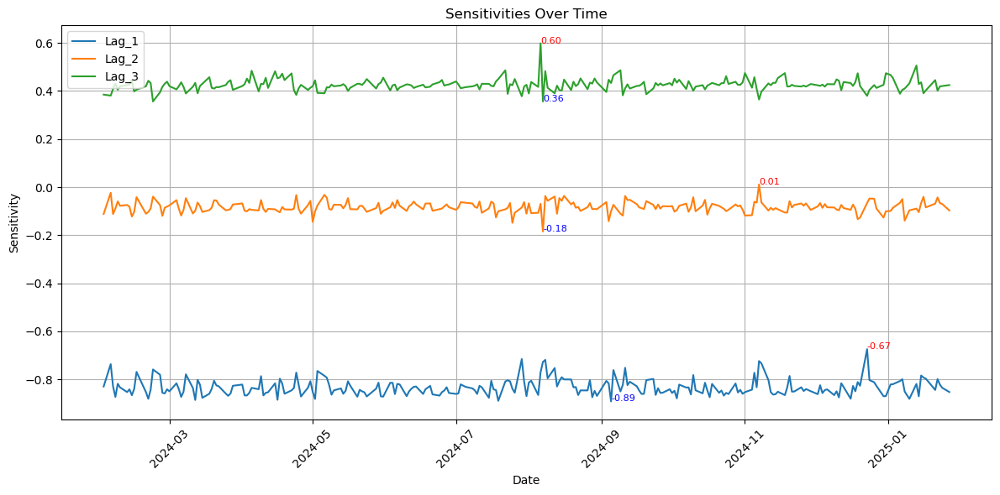

,Intercept,Lag_1,Lag_2,Lag_3,Date
Date,,,,,
2025-01-27,[0.5303370580557865],-0.852094,-0.097155,0.424292,2025-01-27
2025-01-24,[0.49886181910717603],-0.834607,-0.070341,0.420340,2025-01-24
2025-01-23,[0.4854184796558863],-0.821411,-0.066413,0.418837,2025-01-23
2025-01-22,[0.46039334878081223],-0.798351,-0.042823,0.400723,2025-01-22
2025-01-21,[0.45682519469213834],-0.843457,-0.068651,0.444920,2025-01-21
...,...,...,...,...,...
2024-02-08,[0.49391742648235304],-0.817714,-0.059530,0.405241,2024-02-08
2024-02-07,[0.5403764430945788],-0.872467,-0.089268,0.430142,2024-02-07
2024-02-06,[0.5402732704127748],-0.828496,-0.111994,0.407947,2024-02-06


In [50]:
lagged_data = create_lag_features(sp500_data_1y, 3)
lags = 3

inputs = lagged_data[[f't-{i}' for i in range(1, lags + 1)]].values # all t-i (X) values
outputs = lagged_data['t'].values # all t (y) values
dates = lagged_data.index  # Extract the index as dates

# Calculate LPD matrix
lpd_sp500_1y_multiple_lags = calculate_lpd_nn_by_lag(inputs, outputs, dates)
lpd_sp500_1y_multiple_lags.index = lagged_data.index
lpd_sp500_1y_multiple_lags

**Interpretation**: 

- `Lag 1`: Highly negative sensitivity most of the time, often below -0.6 to -0.8, meaning yesterday’s price has a strong inverse effect on today’s prediction.
- `Lag 2`: Generally close to zero, suggesting weaker influence compared to `Lag_1` and `Lag_3`. Also smallest difference between peak and bottom senstivity value, which indicates lower volatility and more stable influence over time.
- `Lag 3`: Shows consistently positive sensitivity, indicating that the price from 3 days ago has a reinforcing effect on predictions.

#### 5-year S&P500

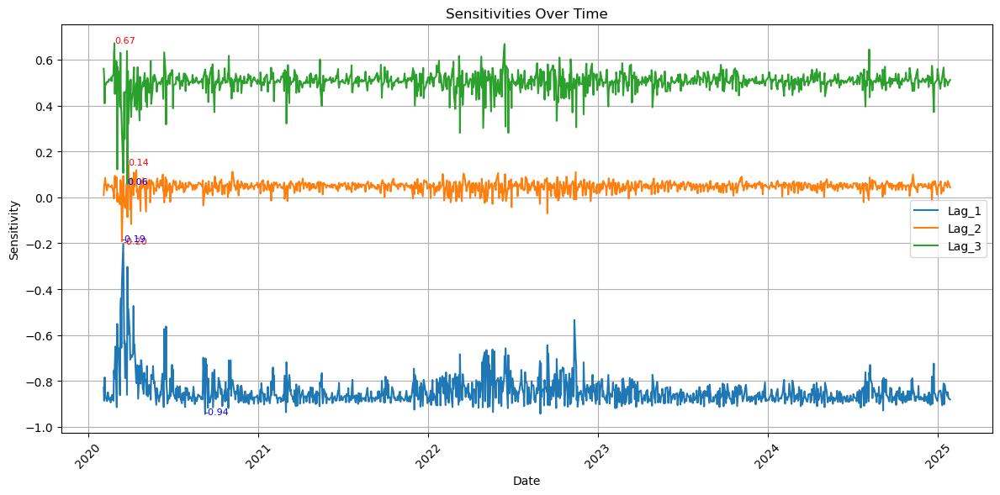

,Intercept,Lag_1,Lag_2,Lag_3,Date
Date,,,,,
2025-01-27,[0.24612019546725533],-0.881068,0.042738,0.511990,2025-01-27
2025-01-24,[0.2408796701175367],-0.876436,0.059525,0.500796,2025-01-24
2025-01-23,[0.23444060393155414],-0.870252,0.064954,0.498713,2025-01-23
2025-01-22,[0.21544423637231153],-0.849194,0.071365,0.488403,2025-01-22
2025-01-21,[0.22684207524720396],-0.865863,0.043182,0.502468,2025-01-21
...,...,...,...,...,...
2020-02-07,[0.2485434447181134],-0.867933,0.062120,0.489144,2020-02-07
2020-02-06,[0.2023022719841689],-0.847758,0.085026,0.498406,2020-02-06
2020-02-05,[0.2394785055241893],-0.784498,0.062397,0.409324,2020-02-05


In [53]:
lagged_data = create_lag_features(sp500_data_5y, 3)
lags = 3

inputs = lagged_data[[f't-{i}' for i in range(1, lags + 1)]].values # all t-i (X) values
outputs = lagged_data['t'].values # all t (y) values
dates = lagged_data.index  # Extract the index as dates

# Calculate LPD matrix
lpd_sp500_5y_multiple_lags = calculate_lpd_nn_by_lag(inputs, outputs, dates)
lpd_sp500_5y_multiple_lags.index = lagged_data.index
lpd_sp500_5y_multiple_lags

**Interpretation**: 

- `Lag 1`: Shows high volatility with several sharp dips and peaks, especially around 2020 and early 2023. Spikes in positive sensitivity (~ 0.23) suggest changing market conditions where yesterday’s price temporarily reinforces today’s movement.
- `Lag 2`: Mostly stable, fluctuating near 0, meaning little influence on predictions.
- `Lag 3`: Maintains a consistently strong positive influence throughout the years.

### Creation LPD (6 lags)

Now, we will focus on creating an analysis for a LPD matrix which is based upon 6 lags, meaning that we look back six days in the past to assess our future price prediction. This will mean more features and thus more potential insights.

### **S&P500**

#### 1-year S&P500

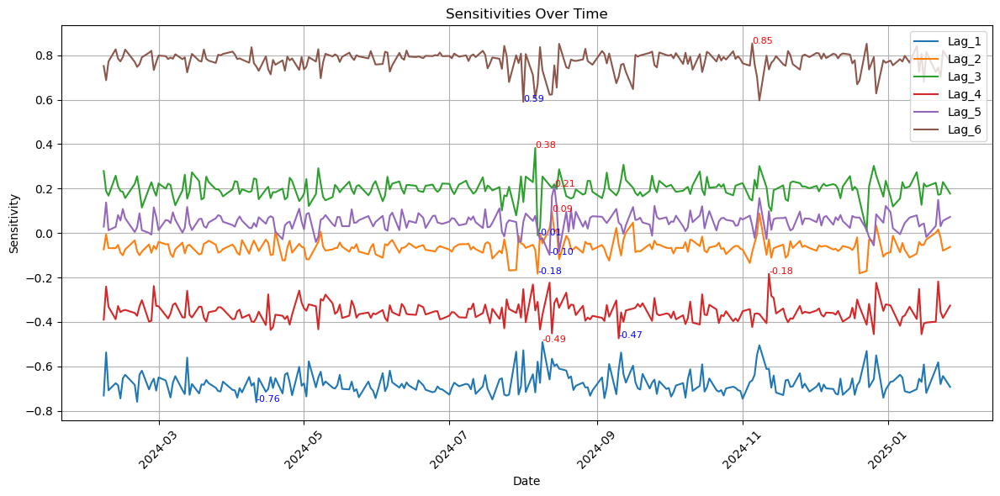

,Intercept,Lag_1,Lag_2,Lag_3,Lag_4,Lag_5,Lag_6,Date
Date,,,,,,,,
2025-01-27,[0.181462933012666],-0.692968,-0.062520,0.177790,-0.326136,0.072470,0.770138,2025-01-27
2025-01-24,[0.091710479160627],-0.643579,-0.079429,0.229751,-0.382379,0.055110,0.821354,2025-01-24
2025-01-23,[0.2793622729036169],-0.680145,-0.020574,0.174638,-0.354221,0.030496,0.701620,2025-01-23
2025-01-22,[-0.20395213612483046],-0.581994,0.015746,0.172371,-0.218214,0.149298,0.745279,2025-01-22
2025-01-21,[0.1627438894840126],-0.611276,0.001349,0.226315,-0.399233,0.031969,0.724049,2025-01-21
...,...,...,...,...,...,...,...,...
2024-02-13,[0.0843727582331045],-0.685108,-0.053560,0.210784,-0.328438,0.080751,0.785263,2024-02-13
2024-02-12,[0.10285507341562458],-0.675979,-0.068146,0.258235,-0.387950,0.027506,0.827077,2024-02-12
2024-02-09,[0.2899278094530614],-0.708103,-0.067957,0.168120,-0.331951,0.012555,0.772224,2024-02-09


In [59]:
lagged_data = create_lag_features(sp500_data_1y, 6)
lags = 6

inputs = lagged_data[[f't-{i}' for i in range(1, lags + 1)]].values # all t-i (X) values
outputs = lagged_data['t'].values # all t (y) values
dates = lagged_data.index  # Extract the index as dates

# Calculate LPD matrix
lpd_sp500_1y_multiple_lags = calculate_lpd_nn_by_lag(inputs, outputs, dates)
lpd_sp500_1y_multiple_lags.index = lagged_data.index
lpd_sp500_1y_multiple_lags

#### 5-year S&P500

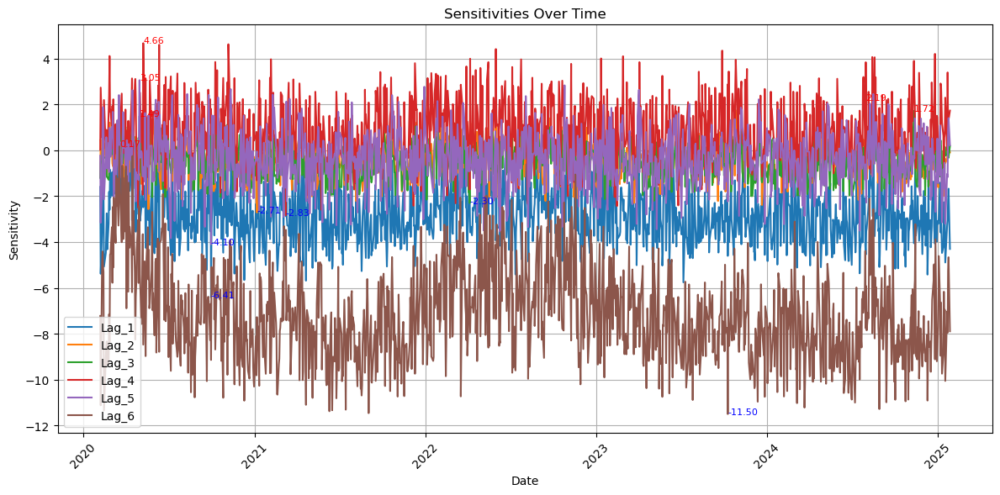

,Intercept,Lag_1,Lag_2,Lag_3,Lag_4,Lag_5,Lag_6,Date
Date,,,,,,,,
2025-01-27,[11.312630227256864],-4.304023,-0.097539,0.182801,1.724861,0.208965,-7.893449,2025-01-27
2025-01-24,[4.009685570344097],-1.678702,0.177475,-0.330660,1.325076,1.400916,-4.665894,2025-01-24
2025-01-23,[4.327308668927342],-2.181699,0.262072,0.760139,1.131071,0.936550,-5.245636,2025-01-23
2025-01-22,[8.943799641212728],-3.040670,1.078402,0.544211,3.387971,-1.175880,-7.956399,2025-01-22
2025-01-21,[14.228603205917588],-3.270771,-0.398333,-0.184321,-0.009372,-1.040519,-7.033716,2025-01-21
...,...,...,...,...,...,...,...,...
2020-02-12,[3.2313307774157245],-1.334028,0.245095,-0.455547,0.937498,1.876953,-5.041116,2020-02-12
2020-02-11,[4.5232812225111285],-1.781068,-0.153628,0.100711,1.047924,1.381086,-4.413525,2020-02-11
2020-02-10,[9.249485835185173],-3.490380,-0.578588,-0.485623,0.535745,-1.741149,-4.897156,2020-02-10


In [61]:
lagged_data = create_lag_features(sp500_data_5y, 6)
lags = 6

inputs = lagged_data[[f't-{i}' for i in range(1, lags + 1)]].values # all t-i (X) values
outputs = lagged_data['t'].values # all t (y) values
dates = lagged_data.index  # Extract the index as dates

# Calculate LPD matrix
lpd_sp500_5y_multiple_lags = calculate_lpd_nn_by_lag(inputs, outputs, dates)
lpd_sp500_5y_multiple_lags.index = lagged_data.index
lpd_sp500_5y_multiple_lags

### **NVIDIA**

#### 1-year NVIDIA

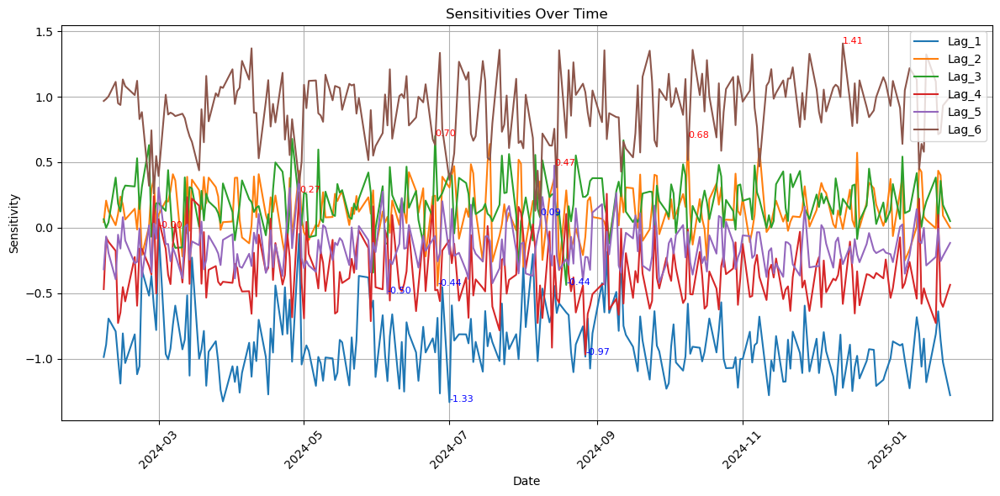

,Intercept,Lag_1,Lag_2,Lag_3,Lag_4,Lag_5,Lag_6,Date
Date,,,,,,,,
2025-01-27,[1.7128039155578998],-1.278124,-0.000954,0.050485,-0.435799,-0.115929,1.000522,2025-01-27
2025-01-24,[1.47009710355142],-1.026601,0.092836,0.174336,-0.603709,-0.216814,0.932357,2025-01-24
2025-01-23,[0.8258284414589316],-0.854064,0.400835,0.357661,-0.562167,-0.254760,0.726117,2025-01-23
2025-01-22,[-0.04959866500775689],-0.637992,0.435263,0.034569,0.098774,-0.007153,0.713193,2025-01-22
2025-01-21,[0.9293055150767457],-0.811773,-0.004671,0.383438,-0.727695,-0.222318,1.115219,2025-01-21
...,...,...,...,...,...,...,...,...
2024-02-13,[1.275195461396208],-0.995677,0.105824,0.183753,-0.726982,-0.053253,0.949851,2024-02-13
2024-02-12,[0.3504694979665983],-0.790723,0.019310,0.382685,-0.176314,-0.392867,1.113168,2024-02-12
2024-02-09,[0.5942056711753659],-0.693150,0.127485,0.041419,-0.107521,-0.192497,1.002753,2024-02-09


In [64]:
lagged_data = create_lag_features(nvidia_data_1y, 6)
lags = 6

inputs = lagged_data[[f't-{i}' for i in range(1, lags + 1)]].values # all t-i (X) values
outputs = lagged_data['t'].values # all t (y) values
dates = lagged_data.index  # Extract the index as dates

# Calculate LPD matrix
nvidia_data_1y_multiple_lags = calculate_lpd_nn_by_lag(inputs, outputs, dates)
nvidia_data_1y_multiple_lags.index = lagged_data.index
nvidia_data_1y_multiple_lags

#### 5-year NVIDIA

/opt/anaconda3/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


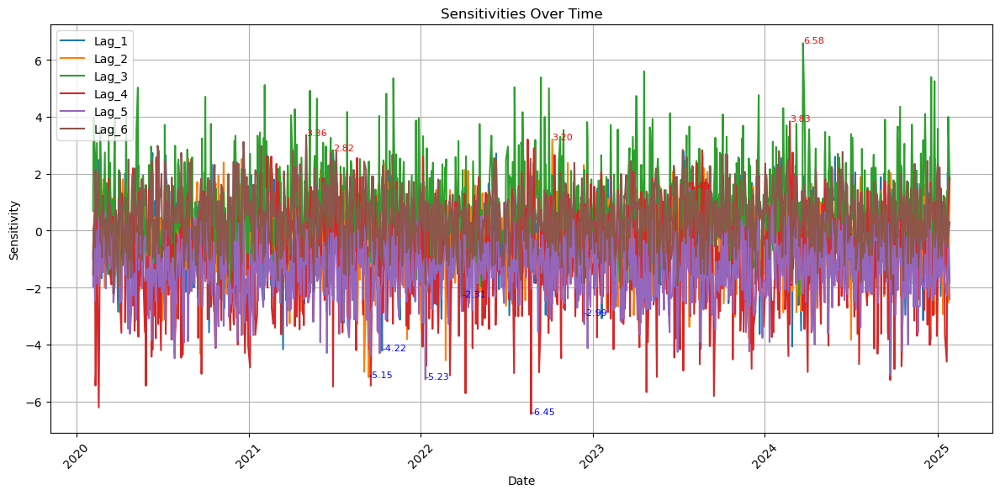

,Intercept,Lag_1,Lag_2,Lag_3,Lag_4,Lag_5,Lag_6,Date
Date,,,,,,,,
2025-01-27,[0.13051726696304988],-1.843750,1.811551,1.743261,1.858643,-2.411689,0.288858,2025-01-27
2025-01-24,[4.4288842315636385],0.366536,-2.527739,3.990653,0.546727,-0.511096,-0.157973,2025-01-24
2025-01-23,[-2.232812735780515],2.041600,1.303927,0.077834,-1.210727,-1.204102,0.564110,2025-01-23
2025-01-22,[-0.07745892173067892],-0.873500,0.908160,1.397891,-0.160535,-1.665813,-0.588915,2025-01-22
2025-01-21,[5.798547879624431],-0.379948,0.638483,-0.053125,-4.608767,-2.277108,-0.369919,2025-01-21
...,...,...,...,...,...,...,...,...
2020-02-12,[-0.3336080117229092],2.593613,1.912883,0.533432,-4.976675,-1.868384,0.999421,2020-02-12
2020-02-11,[-1.6258058658727494],2.730779,1.638747,-0.770315,-5.443717,0.009777,2.124104,2020-02-11
2020-02-10,[1.5924591593427846],-2.003185,1.024510,2.693255,0.740907,-2.449413,-0.604044,2020-02-10


In [66]:
lagged_data = create_lag_features(nvidia_data_5y, 6)
lags = 6

inputs = lagged_data[[f't-{i}' for i in range(1, lags + 1)]].values # all t-i (X) values
outputs = lagged_data['t'].values # all t (y) values
dates = lagged_data.index  # Extract the index as dates

# Calculate LPD matrix
nvidia_data_5y_multiple_lags = calculate_lpd_nn_by_lag(inputs, outputs, dates)
nvidia_data_5y_multiple_lags.index = lagged_data.index
nvidia_data_5y_multiple_lags

### **Apple**

#### 1-year Apple

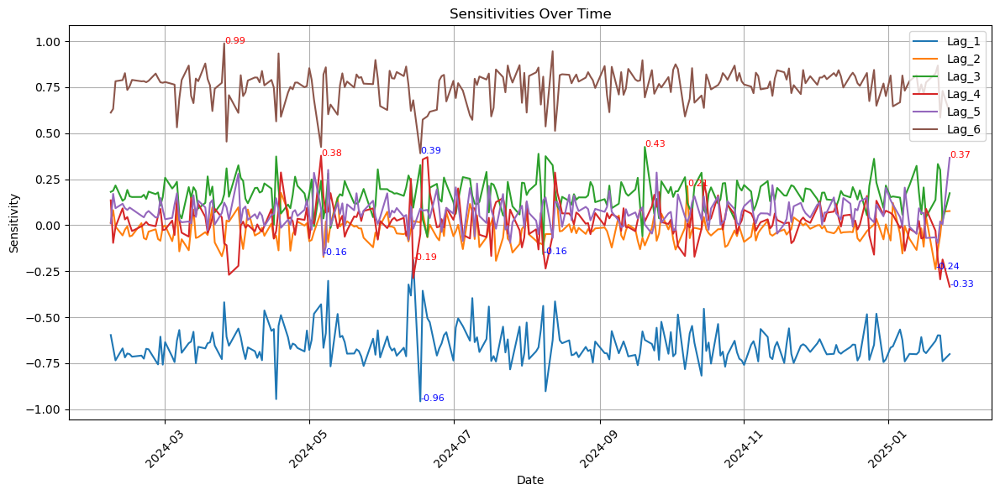

,Intercept,Lag_1,Lag_2,Lag_3,Lag_4,Lag_5,Lag_6,Date
Date,,,,,,,,
2025-01-27,[-0.3154935128039988],-0.700467,0.076839,0.173922,-0.334123,0.366604,0.610114,2025-01-27
2025-01-24,[0.3512574895831578],-0.739847,0.073837,0.025925,-0.186393,0.005252,0.730317,2025-01-24
2025-01-23,[-0.13265234095369544],-0.599186,-0.055470,0.300601,-0.294321,0.021000,0.584901,2025-01-23
2025-01-22,[-0.247392476632823],-0.598404,-0.133851,0.332626,-0.187405,-0.096923,0.867962,2025-01-22
2025-01-21,[0.11774068738217207],-0.629075,-0.238656,0.137794,-0.030358,-0.065803,0.824526,2025-01-21
...,...,...,...,...,...,...,...,...
2024-02-13,[-0.23182018508526242],-0.718705,-0.024226,0.143609,0.031492,0.092801,0.826586,2024-02-13
2024-02-12,[-0.2739011891924539],-0.669625,-0.055566,0.132432,0.091463,0.116591,0.788889,2024-02-12
2024-02-09,[-0.24224218815745585],-0.734764,-0.007660,0.216116,-0.009403,0.092410,0.782645,2024-02-09


In [69]:
lagged_data = create_lag_features(aapl_data_1y, 6)
lags = 6

inputs = lagged_data[[f't-{i}' for i in range(1, lags + 1)]].values # all t-i (X) values
outputs = lagged_data['t'].values # all t (y) values
dates = lagged_data.index  # Extract the index as dates

# Calculate LPD matrix
aapl_data_1y_multiple_lags = calculate_lpd_nn_by_lag(inputs, outputs, dates)
aapl_data_1y_multiple_lags.index = lagged_data.index
aapl_data_1y_multiple_lags

#### 5-year Apple

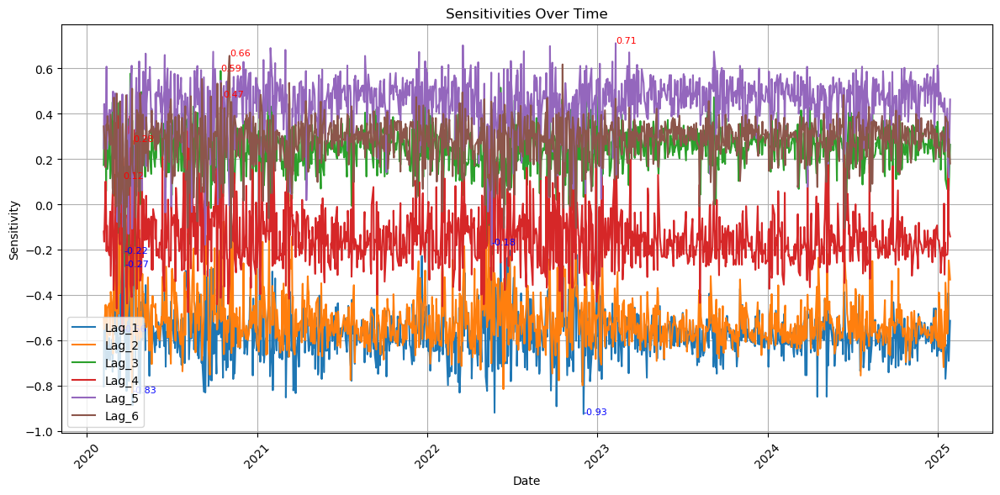

,Intercept,Lag_1,Lag_2,Lag_3,Lag_4,Lag_5,Lag_6,Date
Date,,,,,,,,
2025-01-27,[0.38829388946283094],-0.513954,-0.332581,0.262933,-0.142371,0.462294,0.179366,2025-01-27
2025-01-24,[0.9500458434717166],-0.691450,-0.247957,0.059401,-0.114744,0.118362,0.287822,2025-01-24
2025-01-23,[0.17961864334934502],-0.392382,-0.467096,0.178386,0.157847,0.146304,0.208427,2025-01-23
2025-01-22,[0.69054218545493],-0.625926,-0.534415,0.242949,-0.197237,0.213866,0.362428,2025-01-22
2025-01-21,[0.8347436463130409],-0.619292,-0.571663,0.066435,-0.221900,0.422877,0.364865,2025-01-21
...,...,...,...,...,...,...,...,...
2020-02-12,[0.3216441195564611],-0.550196,-0.453814,0.278081,-0.207532,0.607180,0.351390,2020-02-12
2020-02-11,[0.8064828476109973],-0.727859,-0.524764,0.057552,-0.019814,0.396964,0.284942,2020-02-11
2020-02-10,[0.23507878956484735],-0.487464,-0.443810,0.420635,0.100468,0.193205,0.162606,2020-02-10


In [71]:
lagged_data = create_lag_features(aapl_data_5y, 6)
lags = 6

inputs = lagged_data[[f't-{i}' for i in range(1, lags + 1)]].values # all t-i (X) values
outputs = lagged_data['t'].values # all t (y) values
dates = lagged_data.index  # Extract the index as dates

# Calculate LPD matrix
aapl_data_5y_multiple_lags = calculate_lpd_nn_by_lag(inputs, outputs, dates)
aapl_data_5y_multiple_lags.index = lagged_data.index
aapl_data_5y_multiple_lags

### **Microsoft**

#### 1-year Microsoft

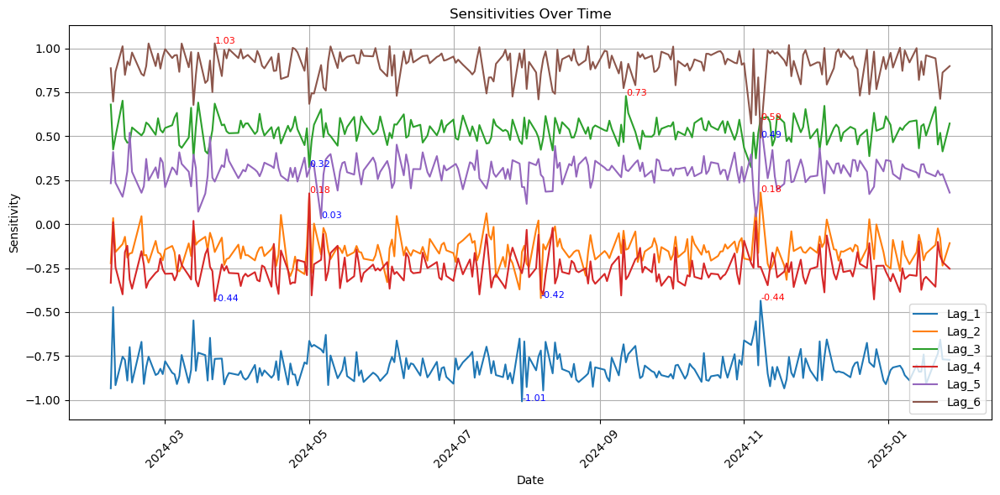

,Intercept,Lag_1,Lag_2,Lag_3,Lag_4,Lag_5,Lag_6,Date
Date,,,,,,,,
2025-01-27,[-0.36040246503367673],-0.771598,-0.107892,0.572664,-0.253202,0.179395,0.898849,2025-01-27
2025-01-24,[-0.2638977479293933],-0.768584,-0.235762,0.413448,-0.215081,0.284666,0.862262,2025-01-24
2025-01-23,[-0.4977547465102616],-0.656660,-0.079393,0.519246,-0.180728,0.279225,0.712526,2025-01-23
2025-01-22,[-0.8226890751588973],-0.736455,-0.024001,0.452909,-0.100370,0.304244,0.834895,2025-01-22
2025-01-21,[-0.553574386731467],-0.769869,-0.117823,0.666722,-0.355781,0.272035,0.943087,2025-01-21
...,...,...,...,...,...,...,...,...
2024-02-13,[-0.6542210390452564],-0.772218,-0.071631,0.487236,-0.158417,0.218543,0.848743,2024-02-13
2024-02-12,[-0.6876287788244825],-0.753466,-0.113059,0.702177,-0.398965,0.155656,1.011846,2024-02-12
2024-02-09,[-0.23063593476000627],-0.915477,-0.158192,0.498039,-0.244846,0.235902,0.867062,2024-02-09


In [74]:
lagged_data = create_lag_features(msft_data_1y, 6)
lags = 6

inputs = lagged_data[[f't-{i}' for i in range(1, lags + 1)]].values # all t-i (X) values
outputs = lagged_data['t'].values # all t (y) valuesdates = lagged_data.index  # Extract the index as dates
dates = lagged_data.index  # Extract the index as dates

# Calculate LPD matrix
msft_data_1y_multiple_lags = calculate_lpd_nn_by_lag(inputs, outputs, dates)
msft_data_1y_multiple_lags.index = lagged_data.index
msft_data_1y_multiple_lags

#### 5-year Microsoft

/opt/anaconda3/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


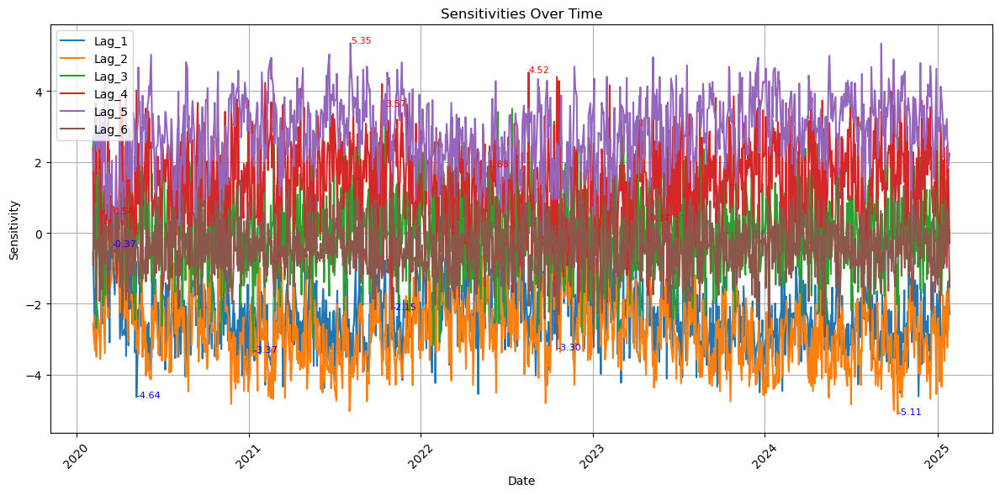

,Intercept,Lag_1,Lag_2,Lag_3,Lag_4,Lag_5,Lag_6,Date
Date,,,,,,,,
2025-01-27,[7.219208408887319],-2.297600,-1.184622,0.078857,-0.300771,2.238199,-1.529035,2025-01-27
2025-01-24,[1.698980044596123],-1.368551,-2.747248,-0.254742,1.796833,1.870968,0.631305,2025-01-24
2025-01-23,[-1.5197133544067427],-1.519635,-2.445992,1.016266,1.598132,2.559486,0.002553,2025-01-23
2025-01-22,[1.5320885444240067],-2.936717,-3.244529,0.252402,2.448810,2.622624,0.555638,2025-01-22
2025-01-21,[3.631303366624998],-2.510863,-1.645387,1.499016,-0.976213,3.213308,-0.380501,2025-01-21
...,...,...,...,...,...,...,...,...
2020-02-12,[1.135468334035043],-2.658796,-2.643936,0.308411,3.649722,2.946732,-1.875168,2020-02-12
2020-02-11,[-0.5816913640412389],-1.567875,-2.314196,-0.011173,2.169244,2.551227,-0.774227,2020-02-11
2020-02-10,[3.7774857912887745],-3.108961,-3.316701,-0.456494,0.861533,3.476227,0.773441,2020-02-10


In [76]:
lagged_data = create_lag_features(msft_data_5y, 6)
lags = 6

inputs = lagged_data[[f't-{i}' for i in range(1, lags + 1)]].values # all t-i (X) values
outputs = lagged_data['t'].values # all t (y) values
dates = lagged_data.index  # Extract the index as dates

# Calculate LPD matrix
msft_data_5y_multiple_lags = calculate_lpd_nn_by_lag(inputs, outputs, dates)
msft_data_5y_multiple_lags.index = lagged_data.index
msft_data_5y_multiple_lags

### Creation LPD (12 lags)

### **S&P500**

#### 1-year S&P500

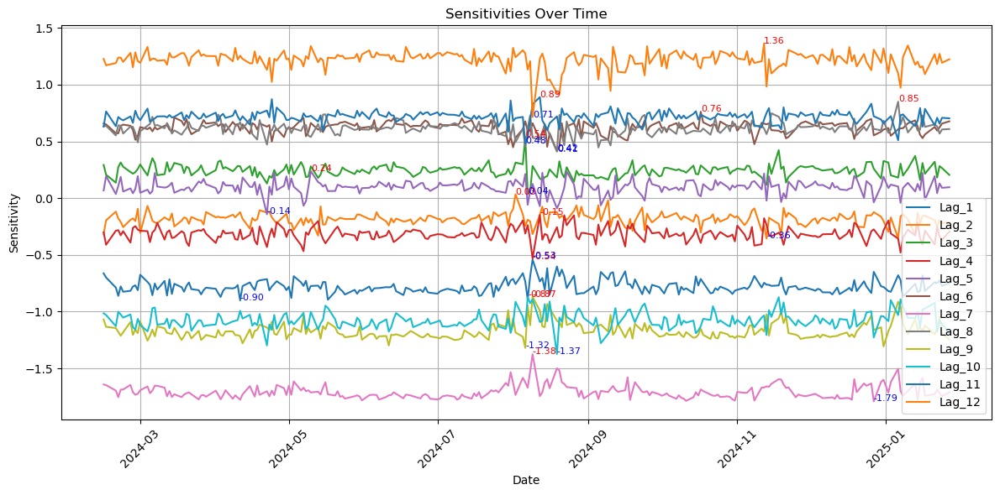

,Intercept,Lag_1,Lag_2,Lag_3,Lag_4,Lag_5,Lag_6,Lag_7,Lag_8,Lag_9,Lag_10,Lag_11,Lag_12,Date
Date,,,,,,,,,,,,,,
2025-01-27,[2.311434060115298],-0.748712,-0.213141,0.204919,-0.294062,0.096216,0.676855,-1.710804,0.608877,-1.244943,-1.190403,0.703431,1.223540,2025-01-27
2025-01-24,[2.299431459821425],-0.773711,-0.218300,0.264970,-0.369017,0.091049,0.656935,-1.745236,0.604970,-1.194595,-1.109130,0.707823,1.192357,2025-01-24
2025-01-23,[1.9314669856812132],-0.725069,-0.196996,0.282060,-0.338786,0.128897,0.623572,-1.718283,0.568174,-1.044086,-1.075973,0.655947,1.271321,2025-01-23
2025-01-22,[2.323484903669221],-0.750049,-0.256526,0.181391,-0.252060,0.043711,0.594995,-1.687487,0.632446,-1.145280,-1.177856,0.708009,1.180589,2025-01-22
2025-01-21,[1.775648686879007],-0.740137,-0.195306,0.320960,-0.408790,0.193324,0.627215,-1.727688,0.649944,-1.200071,-0.923063,0.641855,1.268673,2025-01-21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-02-22,[1.8040697306255045],-0.777522,-0.208702,0.314008,-0.327088,0.187388,0.636048,-1.687241,0.638587,-1.212021,-1.025801,0.696784,1.237816,2024-02-22
2024-02-21,[2.0587932169901824],-0.861168,-0.179011,0.273893,-0.281764,0.107619,0.570684,-1.753630,0.641246,-1.177916,-1.000800,0.714851,1.238839,2024-02-21
2024-02-20,[2.448790441334412],-0.787973,-0.118579,0.136134,-0.287215,0.035927,0.571936,-1.695667,0.552472,-1.144385,-1.127914,0.634091,1.190007,2024-02-20


In [80]:
lagged_data = create_lag_features(sp500_data_1y, 12)
lags = 12

inputs = lagged_data[[f't-{i}' for i in range(1, lags + 1)]].values # all t-i (X) values
outputs = lagged_data['t'].values # all t (y) values
dates = lagged_data.index  # Extract the index as dates

# Calculate LPD matrix
lpd_sp500_1y_multiple_lags = calculate_lpd_nn_by_lag(inputs, outputs, dates)
lpd_sp500_1y_multiple_lags.index = lagged_data.index
lpd_sp500_1y_multiple_lags

#### 5-year S&P500

/opt/anaconda3/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


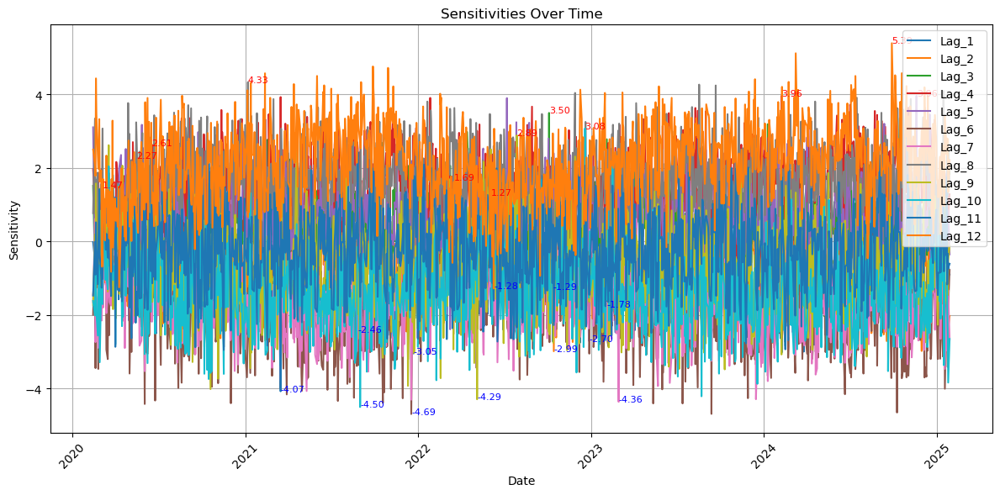

,Intercept,Lag_1,Lag_2,Lag_3,Lag_4,Lag_5,Lag_6,Lag_7,Lag_8,Lag_9,Lag_10,Lag_11,Lag_12,Date
Date,,,,,,,,,,,,,,
2025-01-27,[1.6521907806926635],-0.895408,-2.027157,1.842088,1.283243,-0.352265,-0.774996,-2.662353,1.551323,-0.115476,-2.648930,-0.605681,2.213518,2025-01-27
2025-01-24,[4.034975086248229],-0.603919,-2.362500,2.489226,0.594559,0.846983,-1.814797,-1.325242,2.578723,-0.525461,-3.837129,-0.729113,1.345036,2025-01-24
2025-01-23,[3.5160793778541395],-2.301737,-0.648995,0.667514,1.803476,-0.820445,-3.414213,-1.516335,1.256382,-1.457641,-2.571827,-0.330065,2.779560,2025-01-23
2025-01-22,[0.8707931551145554],-1.997672,-1.421688,0.566923,1.404652,0.146964,-2.111504,-2.970619,2.557967,0.098809,-1.966941,-1.168072,2.802543,2025-01-22
2025-01-21,[-1.5716978384368354],-1.613944,1.266548,-0.596718,1.444020,1.511148,-1.107893,-1.551333,0.307188,-1.700715,-0.439406,1.735437,2.365863,2025-01-21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-02-21,[-0.821949431975021],-0.450471,-1.122553,0.473083,0.990882,1.403420,-2.007573,-1.978617,1.460687,0.167435,-1.930649,-0.204136,3.456568,2020-02-21
2020-02-20,[-1.329021772880733],-0.993899,-1.122975,-0.382716,0.223624,-0.500716,-0.820587,-2.197981,1.669073,1.576615,-1.083135,0.520601,4.433279,2020-02-20
2020-02-19,[2.1591513508283446],-2.015601,1.563171,-0.233719,1.648409,0.687282,-3.443380,-2.736953,0.753330,-0.725071,-0.675330,-0.901143,1.782009,2020-02-19


In [82]:
lagged_data = create_lag_features(sp500_data_5y, 12)
lags = 12

inputs = lagged_data[[f't-{i}' for i in range(1, lags + 1)]].values # all t-i (X) values
outputs = lagged_data['t'].values # all t (y) values
dates = lagged_data.index  # Extract the index as dates

# Calculate LPD matrix
lpd_sp500_5y_multiple_lags = calculate_lpd_nn_by_lag(inputs, outputs, dates)
lpd_sp500_5y_multiple_lags.index = lagged_data.index
lpd_sp500_5y_multiple_lags

### **NVIDIA**

#### 1-year NVIDIA

/opt/anaconda3/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


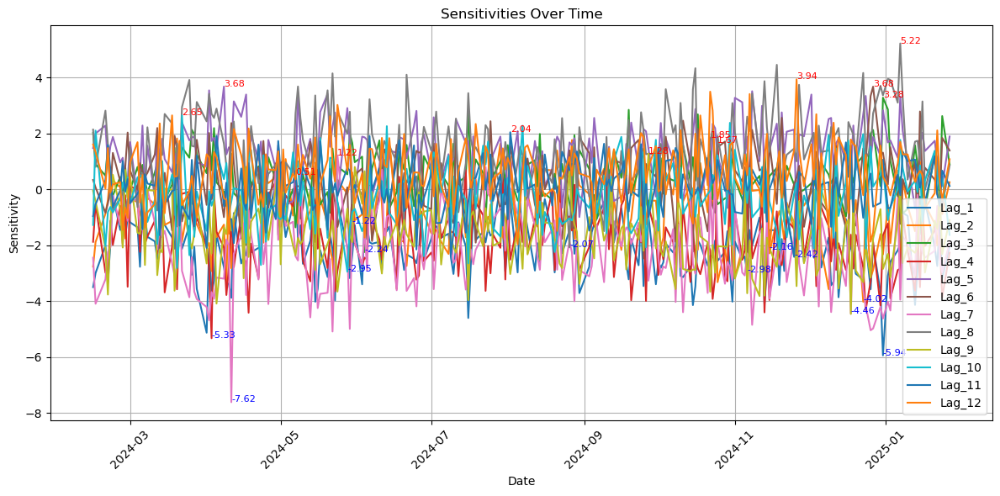

,Intercept,Lag_1,Lag_2,Lag_3,Lag_4,Lag_5,Lag_6,Lag_7,Lag_8,Lag_9,Lag_10,Lag_11,Lag_12,Date
Date,,,,,,,,,,,,,,
2025-01-27,[3.780957390548669],-2.035011,0.257662,0.896878,-2.267150,1.891984,1.391784,-1.884965,0.857519,-1.101341,-1.630610,0.123887,1.077416,2025-01-27
2025-01-24,[9.57097112714268],-3.176141,-0.881195,2.625007,-3.870308,0.118727,1.842608,-2.978119,-0.591626,-2.314208,0.455155,0.671878,-0.370819,2025-01-24
2025-01-23,[6.507213721826978],-1.159622,-0.766969,-0.547459,-1.828759,0.239005,-0.373777,-2.447708,0.329610,-0.071643,0.004449,-0.587663,0.245935,2025-01-23
2025-01-22,[1.9026134500933816],-2.741961,-1.995512,0.976898,-1.107378,0.930689,-0.171939,-0.594164,1.115884,-1.413900,0.482847,-0.177610,2.112680,2025-01-22
2025-01-21,[-0.0074657483410406345],-2.074432,-1.236029,1.276271,-1.472588,1.740093,0.346075,-2.200967,1.366691,-1.124022,1.383135,1.184811,-0.136328,2025-01-21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-02-22,[6.496474688015505],-1.956974,0.709951,-0.210928,-1.124644,1.543972,-0.039427,-2.068114,-0.311859,-1.303344,-0.628594,0.711813,-0.116668,2024-02-22
2024-02-21,[9.884668114162544],-3.334128,-0.381287,1.552391,-3.102048,0.884135,-0.495978,-2.243708,1.594736,-3.765472,-0.809088,1.588070,1.479188,2024-02-21
2024-02-20,[8.27714190347024],-2.000675,-0.871082,0.491397,-2.978807,2.282400,-0.836154,-3.222664,2.817862,-2.101667,-2.027226,0.332263,0.024899,2024-02-20


In [85]:
lagged_data = create_lag_features(nvidia_data_1y, 12)
lags = 12

inputs = lagged_data[[f't-{i}' for i in range(1, lags + 1)]].values # all t-i (X) values
outputs = lagged_data['t'].values # all t (y) values
dates = lagged_data.index  # Extract the index as dates

# Calculate LPD matrix
nvidia_data_1y_multiple_lags = calculate_lpd_nn_by_lag(inputs, outputs, dates)
nvidia_data_1y_multiple_lags.index = lagged_data.index
nvidia_data_1y_multiple_lags

#### 5-year NVIDIA

/opt/anaconda3/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


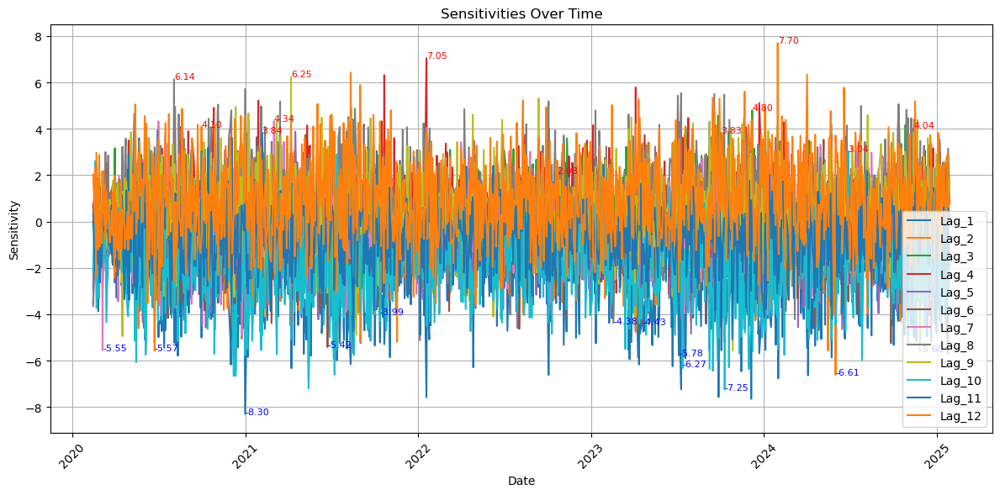

,Intercept,Lag_1,Lag_2,Lag_3,Lag_4,Lag_5,Lag_6,Lag_7,Lag_8,Lag_9,Lag_10,Lag_11,Lag_12,Date
Date,,,,,,,,,,,,,,
2025-01-27,[4.928380268906681],-1.713790,0.332709,-0.041106,0.071647,-1.504631,0.753569,0.866634,0.791829,1.815431,-2.826349,-1.956859,0.893191,2025-01-27
2025-01-24,[-5.471633101293918],-1.598612,-0.032193,0.912641,0.863478,-1.251018,0.848717,1.707909,3.146462,0.264069,-1.302695,-0.022177,0.645798,2025-01-24
2025-01-23,[3.7967115171586707],-5.695541,-3.508308,-0.326726,2.757368,-1.084330,-2.055819,-0.110679,0.032408,0.444849,-3.916136,2.253521,2.930524,2025-01-23
2025-01-22,[5.973769128067606],-3.230567,-2.450372,0.500687,2.493652,-2.117392,-2.523355,-1.168903,-0.560666,1.825570,-1.902785,0.990459,2.717487,2025-01-22
2025-01-21,[6.024292486955801],-3.146239,1.338888,2.791851,-2.560540,-0.294196,-4.915851,0.845162,0.407020,0.518517,-1.697123,-2.067141,-0.012279,2025-01-21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-02-21,[0.7485139548039181],-2.608691,-1.810297,-0.197322,0.889224,-1.005406,-1.219221,0.005787,0.812448,0.955598,-3.724692,1.323554,2.968946,2020-02-21
2020-02-20,[8.010995073604906],-1.877365,-0.696830,2.085954,0.220805,-0.593687,-0.443775,1.271225,1.933828,-1.390829,-0.624934,-1.684564,-2.401696,2020-02-20
2020-02-19,[-2.7442522368522155],-0.782566,2.172784,1.396674,-0.522065,-0.268373,-1.617012,0.193426,2.195485,0.211315,2.611824,-1.060938,2.304501,2020-02-19


In [87]:
lagged_data = create_lag_features(nvidia_data_5y, 12)
lags = 12

inputs = lagged_data[[f't-{i}' for i in range(1, lags + 1)]].values # all t-i (X) values
outputs = lagged_data['t'].values # all t (y) values
dates = lagged_data.index  # Extract the index as dates

# Calculate LPD matrix
nvidia_data_5y_multiple_lags = calculate_lpd_nn_by_lag(inputs, outputs, dates)
nvidia_data_5y_multiple_lags.index = lagged_data.index
nvidia_data_5y_multiple_lags

### **Apple**

#### 1-year Apple

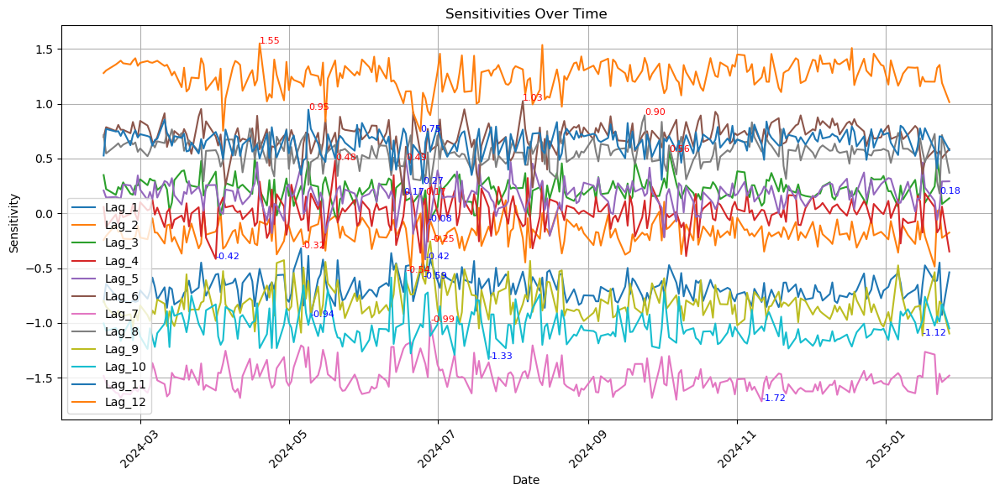

,Intercept,Lag_1,Lag_2,Lag_3,Lag_4,Lag_5,Lag_6,Lag_7,Lag_8,Lag_9,Lag_10,Lag_11,Lag_12,Date
Date,,,,,,,,,,,,,,
2025-01-27,[1.9418243099273578],-0.538360,-0.176037,0.137732,-0.348561,0.292264,0.587292,-1.481156,0.370686,-1.097104,-1.050504,0.575777,1.015276,2025-01-27
2025-01-24,[0.7596553567047548],-0.927905,-0.224044,0.084692,0.061378,0.290790,0.506300,-1.539693,0.714368,-0.834640,-0.829950,0.698220,1.190266,2025-01-24
2025-01-23,[0.8892471177781943],-0.449371,0.030869,0.339377,-0.137961,0.055838,0.565828,-1.463899,0.181255,-0.804767,-0.987902,0.703433,1.354884,2025-01-23
2025-01-22,[1.285990231286927],-0.613374,0.021324,0.497186,-0.174567,-0.058675,0.546440,-1.651743,0.288992,-0.995127,-0.940362,0.410075,1.326907,2025-01-22
2025-01-21,[0.743587768266438],-0.621728,-0.486946,0.246376,0.055352,0.112480,0.579604,-1.289185,0.724912,-0.536898,-1.025962,0.579098,1.201161,2025-01-21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-02-22,[1.1920684782762783],-0.806685,-0.164939,0.217663,0.020628,0.134138,0.763473,-1.686036,0.604736,-0.926297,-1.165240,0.706539,1.393523,2024-02-22
2024-02-21,[0.9294188267308692],-0.784529,-0.167380,0.239611,-0.101423,0.142484,0.807214,-1.642859,0.639107,-0.889695,-1.080069,0.750058,1.375380,2024-02-21
2024-02-20,[0.8992614770115666],-0.753867,-0.103465,0.168630,-0.009788,0.149102,0.751244,-1.637151,0.618301,-0.945811,-1.047654,0.746879,1.358587,2024-02-20


In [90]:
lagged_data = create_lag_features(aapl_data_1y, 12)
lags = 12

inputs = lagged_data[[f't-{i}' for i in range(1, lags + 1)]].values # all t-i (X) values
outputs = lagged_data['t'].values # all t (y) values
dates = lagged_data.index  # Extract the index as dates

# Calculate LPD matrix
aapl_data_1y_multiple_lags = calculate_lpd_nn_by_lag(inputs, outputs, dates)
aapl_data_1y_multiple_lags.index = lagged_data.index
aapl_data_1y_multiple_lags

#### 5-year Apple

/opt/anaconda3/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


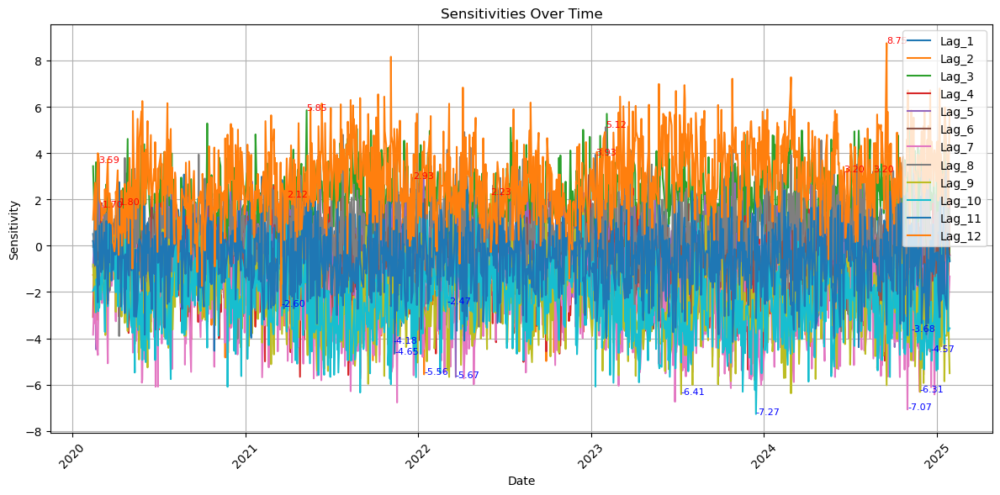

,Intercept,Lag_1,Lag_2,Lag_3,Lag_4,Lag_5,Lag_6,Lag_7,Lag_8,Lag_9,Lag_10,Lag_11,Lag_12,Date
Date,,,,,,,,,,,,,,
2025-01-27,[0.4303015779711785],-0.634031,0.270199,-0.635483,1.993604,-0.438694,-0.389326,-1.328553,1.564759,-5.508840,-3.565792,-0.681575,5.891623,2025-01-27
2025-01-24,[8.123908739066636],-0.126524,-1.094861,2.898662,-2.025426,-0.496482,-0.210798,-2.839472,0.479843,-2.794341,-3.696114,-0.328697,1.673058,2025-01-24
2025-01-23,[3.0887217407727383],2.106584,0.691542,0.294175,-1.234389,-1.469347,-1.271780,-3.523391,1.130857,-0.722076,0.014999,0.310161,3.338950,2025-01-23
2025-01-22,[5.971509122154732],-0.256011,-0.026777,0.988543,-1.364977,-0.692570,-0.663340,-3.496520,-0.795797,-3.401350,-1.359723,0.548686,3.928795,2025-01-22
2025-01-21,[2.238943800846492],-1.721696,-1.293552,1.249936,0.422852,-0.249293,1.110341,-0.402425,3.550927,-3.892332,-1.782967,-2.742024,3.687734,2025-01-21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-02-21,[6.8456751785093495],-0.252930,-2.686155,1.193417,-1.138441,1.467075,0.363403,-4.162449,0.414725,-1.760745,-1.446167,0.149681,1.864338,2020-02-21
2020-02-20,[13.338108879708116],-0.798298,-2.577530,3.604102,-3.018875,-4.477769,0.644953,-2.146381,-1.938362,-2.061437,-2.879463,1.382210,1.166044,2020-02-20
2020-02-19,[3.9451561679322453],-0.716951,-0.839687,0.442667,-1.104246,0.776180,-1.354659,-3.374969,1.852189,-0.922313,-1.827411,0.180399,0.684280,2020-02-19


In [92]:
lagged_data = create_lag_features(aapl_data_5y, 12)
lags = 12

inputs = lagged_data[[f't-{i}' for i in range(1, lags + 1)]].values # all t-i (X) values
outputs = lagged_data['t'].values # all t (y) values
dates = lagged_data.index  # Extract the index as dates

# Calculate LPD matrix
aapl_data_5y_multiple_lags = calculate_lpd_nn_by_lag(inputs, outputs, dates)
aapl_data_5y_multiple_lags.index = lagged_data.index
aapl_data_5y_multiple_lags

### **Microsoft**

#### 1-year Microsoft

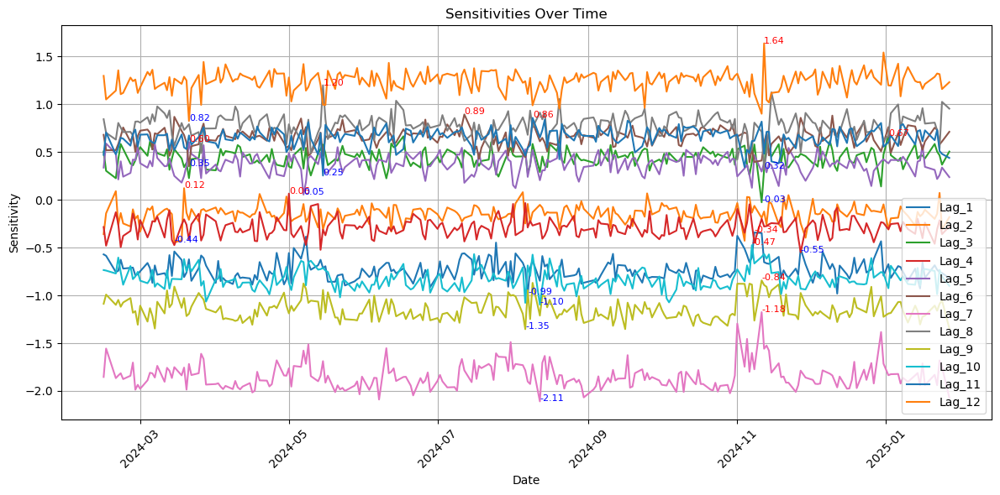

,Intercept,Lag_1,Lag_2,Lag_3,Lag_4,Lag_5,Lag_6,Lag_7,Lag_8,Lag_9,Lag_10,Lag_11,Lag_12,Date
Date,,,,,,,,,,,,,,
2025-01-27,[1.7558997191624819],-0.820691,-0.181491,0.504856,-0.280824,0.237300,0.711574,-2.070902,0.954170,-1.345331,-0.899764,0.438207,1.230772,2025-01-27
2025-01-24,[1.0680154731011307],-0.765622,-0.312251,0.367853,-0.358688,0.337640,0.610358,-1.750087,1.024904,-1.053294,-0.802682,0.480408,1.158702,2025-01-24
2025-01-23,[0.6562314136536174],-0.756660,0.072162,0.465356,-0.214312,0.258492,0.578971,-1.680755,0.537571,-1.089336,-0.732799,0.509763,1.314607,2025-01-23
2025-01-22,[1.0432892564708778],-0.732192,-0.146126,0.504660,-0.308559,0.217912,0.731841,-1.939681,0.726191,-1.160636,-0.987245,0.732453,1.321465,2025-01-22
2025-01-21,[0.5994441592532463],-0.684893,-0.199317,0.584552,-0.460330,0.312963,0.754870,-1.831350,0.807493,-1.106957,-0.744687,0.623560,1.286880,2025-01-21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-02-22,[0.7472989278266202],-0.626834,-0.138395,0.583698,-0.494690,0.402414,0.663848,-1.815166,0.755167,-1.118751,-0.757467,0.649559,1.105362,2024-02-22
2024-02-21,[0.8514124626739863],-0.743080,-0.262510,0.427288,-0.255521,0.213173,0.583740,-1.838691,0.804311,-1.047347,-0.604647,0.546508,1.354921,2024-02-21
2024-02-20,[1.0489534422847149],-0.755505,0.090475,0.225895,-0.130026,0.482961,0.519806,-1.865939,0.630161,-1.099219,-0.771065,0.475392,1.142761,2024-02-20


In [95]:
lagged_data = create_lag_features(msft_data_1y, 12)
lags = 12

inputs = lagged_data[[f't-{i}' for i in range(1, lags + 1)]].values # all t-i (X) values
outputs = lagged_data['t'].values # all t (y) values
dates = lagged_data.index  # Extract the index as dates

# Calculate LPD matrix
msft_data_1y_multiple_lags = calculate_lpd_nn_by_lag(inputs, outputs, dates)
msft_data_1y_multiple_lags.index = lagged_data.index
msft_data_1y_multiple_lags

#### 5-year Microsoft

/opt/anaconda3/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


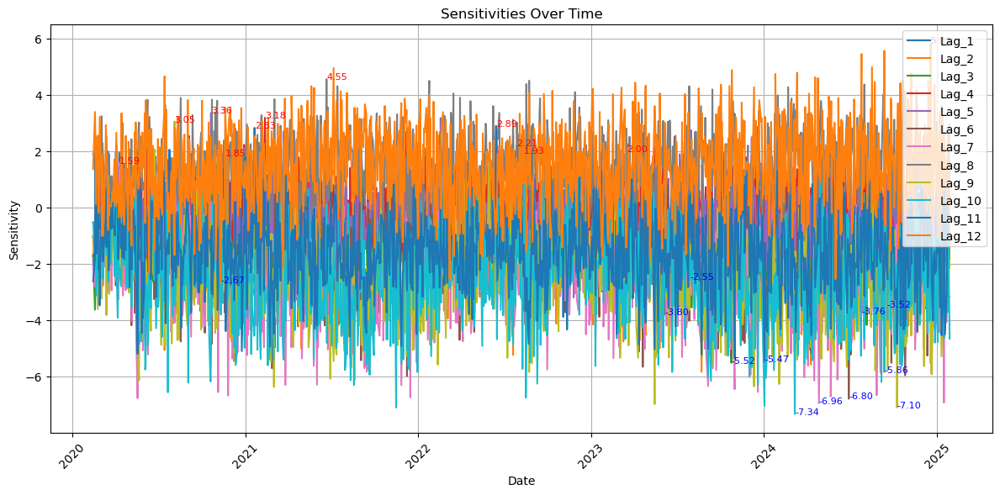

,Intercept,Lag_1,Lag_2,Lag_3,Lag_4,Lag_5,Lag_6,Lag_7,Lag_8,Lag_9,Lag_10,Lag_11,Lag_12,Date
Date,,,,,,,,,,,,,,
2025-01-27,[10.059960568991857],1.604950,-1.075074,-1.853603,-1.327899,2.959331,-0.591419,-3.169265,1.526692,-2.153721,-4.662192,0.399336,-0.964870,2025-01-27
2025-01-24,[1.5693944327752074],-0.280327,-0.799323,0.156505,0.224809,-0.750749,-1.313337,-3.183197,1.937221,-0.749107,-0.265363,-0.292517,2.764161,2025-01-24
2025-01-23,[9.170720339348453],-1.958374,-2.689579,-0.835736,1.646124,-0.042822,-3.397716,-1.431512,1.566204,-1.975705,-3.722171,0.222371,2.238921,2025-01-23
2025-01-22,[9.921938528794835],-1.192068,-2.317003,-2.794145,0.107805,-0.153938,-1.564304,-1.431507,1.754194,-1.967141,-2.474660,-0.566516,1.344779,2025-01-22
2025-01-21,[20.508694091989423],0.369004,-1.328181,-1.613353,-0.995000,-1.393429,-3.204220,-4.055407,1.443291,-2.422376,-1.932314,-3.114935,0.132658,2025-01-21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-02-21,[9.304397659898216],-0.661866,-1.494237,-2.183337,1.898395,-0.588691,-1.965738,-0.237572,0.485231,-2.082489,-3.126936,-1.647817,2.418762,2020-02-21
2020-02-20,[7.078693399783143],-0.434235,-1.254093,-0.001175,-1.885602,-0.031650,-1.404957,-1.463779,2.421696,-0.563689,-1.483535,-0.328173,0.116445,2020-02-20
2020-02-19,[-3.56854543334609],-0.767998,-0.105890,-2.414910,1.880087,-0.874749,-1.579564,0.790486,1.066094,-0.864738,-0.884946,2.045786,2.419250,2020-02-19


In [97]:
lagged_data = create_lag_features(msft_data_5y, 12)
lags = 12

inputs = lagged_data[[f't-{i}' for i in range(1, lags + 1)]].values # all t-i (X) values
outputs = lagged_data['t'].values # all t (y) values
dates = lagged_data.index  # Extract the index as dates

# Calculate LPD matrix
msft_data_5y_multiple_lags = calculate_lpd_nn_by_lag(inputs, outputs, dates)
msft_data_5y_multiple_lags.index = lagged_data.index
msft_data_5y_multiple_lags

In the context of Linear Parameter Data (LPD), the positive and negative sensitivities are a result of the relationship between input features (neurons) and the output at specific points in time. Here's why sensitivities can be both positive and negative:

**Positive Sensitivities:**
- Indicate that increasing the value of a specific input (neuron) increases the output. This happens when the partial derivative of the output with respect to the input is positive.

**Negative Sensitivities:**
- Indicate that increasing the value of a specific input (neuron) decreases the output. This happens when the partial derivative of the output with respect to the input is negative.

# Stock(s) Analysis with LPD (Single Lag) - Using MLP

## Creation LPD & Plots

In [232]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.neural_network import MLPRegressor

def calculate_lpd_for_specific_lag_nn(inputs, outputs, dates, lag_number, n_runs=10):
    """
    Calculate the Linear Parameter Data (LPD) for a specific lag and visualize the outcomes of multiple neural network runs.

    Parameters:
        inputs (np.ndarray): Input features (lagged features), shape (n_samples, n_features).
        outputs (np.ndarray): Output values, shape (n_samples,).
        dates (pd.Index or pd.Series): The dates corresponding to each row in `inputs`.
        lag_number (int): The lag number to assess (1-indexed).
        n_runs (int): The number of times to run the neural network.

    Returns:
        pd.DataFrame: A DataFrame containing the sensitivity results for the specified lag across multiple runs.
    """
    # Ensure the lag_number is valid
    if lag_number < 1 or lag_number > inputs.shape[1]:
        raise ValueError(f"Lag number must be between 1 and {inputs.shape[1]}.")

    # Ensure the length of dates matches the number of rows in inputs/outputs
    if len(dates) != len(outputs):
        raise ValueError("The length of 'dates' must match the number of rows in 'inputs' and 'outputs'.")

    # Store results for each run
    sensitivities = []

    for run in range(n_runs):
        # Define and train the MLP Regressor
        mlp = MLPRegressor(hidden_layer_sizes=(100,), activation='logistic', max_iter=1000, random_state=run) # Random state changes every time due to this
        mlp.fit(inputs, outputs)

        # Extract coefficients (weights) and intercepts
        hidden_layer_weights = mlp.coefs_[0]
        hidden_layer_biases = mlp.intercepts_[0]

        # Extract the weights for the specified lag
        lag_weights = hidden_layer_weights[lag_number - 1, :]  # Subtract 1 to match 0-indexing

        # Calculate sensitivities for the specified lag
        lag_sensitivities = []
        for i in range(len(outputs)):
            x = inputs[i]  # Input for the current time step

            # Calculate hidden layer activations
            hidden_activations = np.dot(x, hidden_layer_weights) + hidden_layer_biases
            hidden_activations = 1 / (1 + np.power(hidden_activations, 2))  # Arctan-like activation derivative

            # Calculate the sensitivity for the specified lag
            sensitivity = np.dot(lag_weights, hidden_activations)
            lag_sensitivities.append(sensitivity)

        sensitivities.append(lag_sensitivities)

    # Convert sensitivities to DataFrame
    sensitivity_df = pd.DataFrame(sensitivities).T  # Transpose to have time steps as rows
    sensitivity_df["Date"] = dates

    # Plot sensitivities across runs
    plt.figure(figsize=(12, 6))
    for run in range(n_runs):
        plt.plot(sensitivity_df["Date"], sensitivity_df[run], label=f"Run {run + 1}")

    # Customize the plot
    plt.title(f"Sensitivities for Lag {lag_number} Across {n_runs} Runs")
    plt.xlabel("Date")
    plt.ylabel("Sensitivity")
    # plt.legend()
    plt.grid(True)

    # Rotate the x-axis labels for better readability
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    return sensitivity_df

### Creation LPD for 6th Lag

### **S&P500**

#### 1-year S&P500

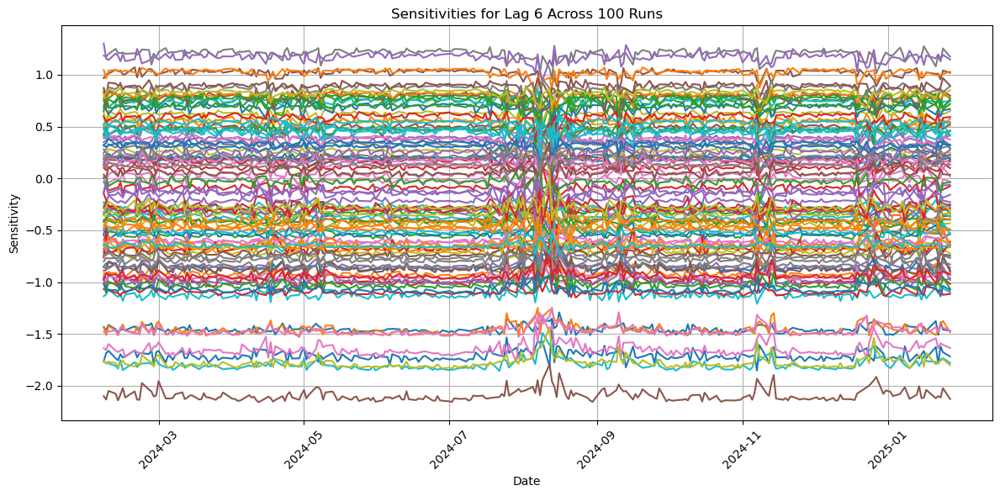

,0,1,2,3,4,5,6,7,8,9,...,91,92,93,94,95,96,97,98,99,Date
Date,,,,,,,,,,,,,,,,,,,,,
2025-01-27,0.228742,-0.660686,-0.497757,0.099130,0.320158,-0.360465,0.158502,-0.768028,0.504587,-0.370294,...,-0.392984,-0.038193,-0.293339,-0.157499,0.035187,0.155798,0.222744,-0.312626,-0.648424,2025-01-27
2025-01-24,0.211490,-0.680785,-0.458445,0.144274,0.370640,-0.365000,0.100380,-0.741951,0.568062,-0.339517,...,-0.387325,-0.046715,-0.304754,-0.186046,0.039949,0.170333,0.201148,-0.250261,-0.652960,2025-01-24
2025-01-23,0.250714,-0.636748,-0.439176,0.111358,0.375343,-0.288819,0.108764,-0.732708,0.548399,-0.338653,...,-0.375221,-0.143634,-0.266588,-0.158986,0.089165,0.185974,0.155010,-0.267495,-0.692412,2025-01-23
2025-01-22,0.180999,-0.687365,-0.530600,0.072025,0.346476,-0.424530,0.107463,-0.809877,0.554075,-0.355565,...,-0.383640,-0.037239,-0.255905,-0.150994,-0.002296,0.178895,0.246561,-0.260406,-0.631742,2025-01-22
2025-01-21,0.218853,-0.671615,-0.532915,0.072946,0.245485,-0.374645,0.171193,-0.764050,0.478826,-0.461755,...,-0.430995,0.000191,-0.321753,-0.038274,0.024269,0.184866,0.115372,-0.310829,-0.623496,2025-01-21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-02-13,0.209178,-0.691026,-0.559223,0.093927,0.340789,-0.409991,0.142981,-0.806860,0.546457,-0.369359,...,-0.419119,-0.025034,-0.302603,-0.132274,0.020431,0.168675,0.220708,-0.300203,-0.655263,2024-02-13
2024-02-12,0.208548,-0.690308,-0.521631,0.136548,0.390668,-0.386095,0.116790,-0.766771,0.559617,-0.343994,...,-0.406957,-0.032061,-0.292529,-0.158016,0.044257,0.191608,0.199867,-0.269411,-0.664567,2024-02-12
2024-02-09,0.195786,-0.655027,-0.511804,0.100423,0.400564,-0.331965,0.158630,-0.771020,0.610564,-0.366156,...,-0.384975,-0.073973,-0.275403,-0.162871,0.110057,0.196483,0.201894,-0.222898,-0.669941,2024-02-09


In [105]:
lagged_data = create_lag_features(sp500_data_1y, 6)
lags = 6

inputs = lagged_data[[f't-{i}' for i in range(1, lags + 1)]].values # all t-i (X) values
outputs = lagged_data['t'].values # all t (y) values
dates = lagged_data.index  # Extract the index as dates

# Specify the lag to assess and number of runs
lag_number = 6
n_runs = 100

# Calculate LPD matrix
lpd_sp500_1y_specific_lag = calculate_lpd_for_specific_lag_nn(inputs, outputs, dates, lag_number, n_runs)
lpd_sp500_1y_specific_lag.index = lagged_data.index
lpd_sp500_1y_specific_lag

In [ ]:
def plot_lpd_mean_and_bands(dataframe):
    """
    Compute and plot the mean sensitivity and the two-sigma upper and lower bands for the given dataset.

    Parameters:
        lpd_sp500_1y_multiple_lags (pd.DataFrame): A DataFrame containing multiple lag sensitivity values indexed by Date.
    """
    # Ensure the Date column is set as index
    if "Date" in dataframe.columns:
        dataframe = dataframe.set_index("Date")

    # Drop non-numeric columns if any
    numeric_df = dataframe.select_dtypes(include=[np.number])

    # Compute mean and 2σ bounds
    numeric_df["Mean"] = dataframe.mean(axis=1)
    numeric_df["Upper_2Sigma"] = numeric_df["Mean"] + 2 * numeric_df.std(axis=1)
    numeric_df["Lower_2Sigma"] = numeric_df["Mean"] - 2 * numeric_df.std(axis=1)

    # Plot mean and bands
    plt.figure(figsize=(12, 6))
    plt.plot(numeric_df.index, numeric_df["Mean"], label="Mean Sensitivity", linewidth=2)
    plt.plot(numeric_df.index, numeric_df["Upper_2Sigma"], label="Upper 2σ Band", linestyle="-", color='darkgrey')
    plt.plot(numeric_df.index, numeric_df["Lower_2Sigma"], label="Lower 2σ Band", linestyle="-", color='lightgrey')

    # Customize the plot
    plt.title("Mean Sensitivity and 2σ Bands")
    plt.xlabel("Date")
    plt.ylabel("Sensitivity")
    plt.legend()
    plt.grid(True)

    # Rotate x-axis labels for better readability
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    return numeric_df

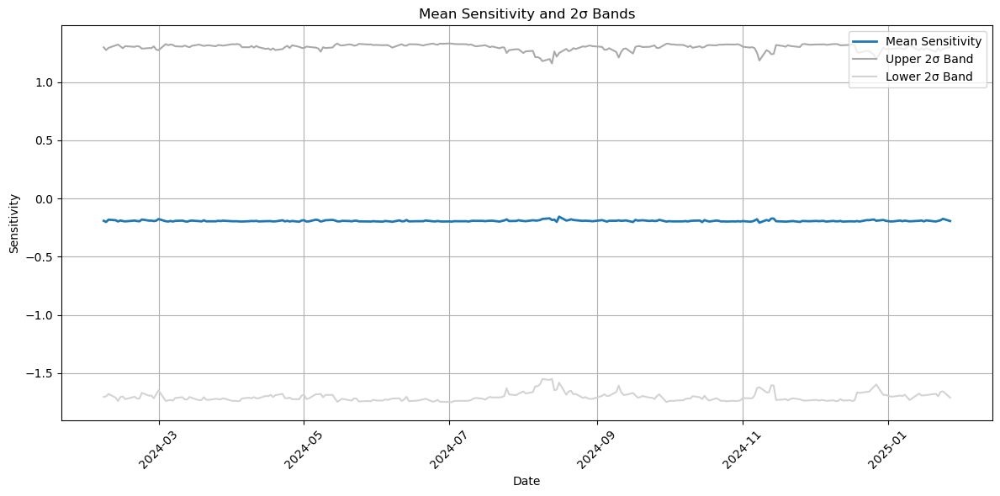

,0,1,2,3,4,5,6,7,8,9,...,93,94,95,96,97,98,99,Mean,Upper_2Sigma,Lower_2Sigma
Date,,,,,,,,,,,,,,,,,,,,,
2025-01-27,0.228742,-0.660686,-0.497757,0.099130,0.320158,-0.360465,0.158502,-0.768028,0.504587,-0.370294,...,-0.293339,-0.157499,0.035187,0.155798,0.222744,-0.312626,-0.648424,-0.193597,1.301388,-1.710337
2025-01-24,0.211490,-0.680785,-0.458445,0.144274,0.370640,-0.365000,0.100380,-0.741951,0.568062,-0.339517,...,-0.304754,-0.186046,0.039949,0.170333,0.201148,-0.250261,-0.652960,-0.175014,1.285109,-1.656384
2025-01-23,0.250714,-0.636748,-0.439176,0.111358,0.375343,-0.288819,0.108764,-0.732708,0.548399,-0.338653,...,-0.266588,-0.158986,0.089165,0.185974,0.155010,-0.267495,-0.692412,-0.187019,1.265541,-1.660716
2025-01-22,0.180999,-0.687365,-0.530600,0.072025,0.346476,-0.424530,0.107463,-0.809877,0.554075,-0.355565,...,-0.255905,-0.150994,-0.002296,0.178895,0.246561,-0.260406,-0.631742,-0.192643,1.292001,-1.698890
2025-01-21,0.218853,-0.671615,-0.532915,0.072946,0.245485,-0.374645,0.171193,-0.764050,0.478826,-0.461755,...,-0.321753,-0.038274,0.024269,0.184866,0.115372,-0.310829,-0.623496,-0.197956,1.260139,-1.677268
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-02-13,0.209178,-0.691026,-0.559223,0.093927,0.340789,-0.409991,0.142981,-0.806860,0.546457,-0.369359,...,-0.302603,-0.132274,0.020431,0.168675,0.220708,-0.300203,-0.655263,-0.197717,1.321767,-1.739311
2024-02-12,0.208548,-0.690308,-0.521631,0.136548,0.390668,-0.386095,0.116790,-0.766771,0.559617,-0.343994,...,-0.292529,-0.158016,0.044257,0.191608,0.199867,-0.269411,-0.664567,-0.186938,1.314655,-1.710381
2024-02-09,0.195786,-0.655027,-0.511804,0.100423,0.400564,-0.331965,0.158630,-0.771020,0.610564,-0.366156,...,-0.275403,-0.162871,0.110057,0.196483,0.201894,-0.222898,-0.669941,-0.182182,1.293058,-1.678889


In [222]:
plot_lpd_mean_and_bands(lpd_sp500_1y_specific_lag)

#### 5-year S&P500

/opt/anaconda3/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/neural_netwo

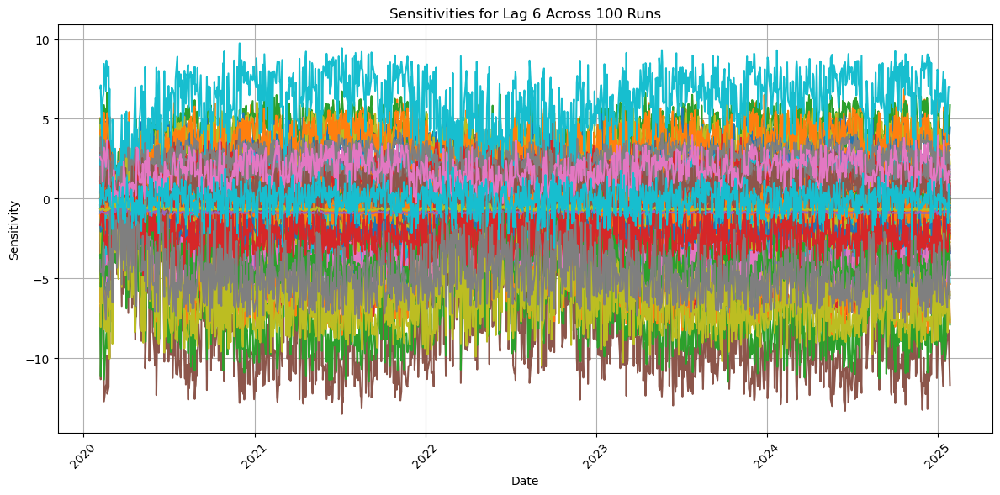

,0,1,2,3,4,5,6,7,8,9,...,91,92,93,94,95,96,97,98,99,Date
Date,,,,,,,,,,,,,,,,,,,,,
2025-01-27,-4.774564,-4.334397,-0.492560,0.002052,-0.014879,-2.000011,-4.342345,2.093317,-2.440500,-0.076620,...,-2.345217,-4.839747,-2.146337,-0.889516,1.696063,1.485012,-6.261243,-0.688905,-0.867623,2025-01-27
2025-01-24,-1.762606,-1.588717,2.258311,-0.022802,1.694387,-1.219245,-3.494851,0.542558,-1.031815,-0.103114,...,-0.371130,-1.937172,-1.907578,-0.894576,-0.085973,1.757822,-3.993498,-0.638551,0.903424,2025-01-24
2025-01-23,-2.165304,-3.214890,0.272250,0.068113,1.184068,-0.853708,-3.486622,1.766838,-2.386292,-0.030494,...,-1.008973,-2.934124,-1.328870,-0.885555,2.147293,1.604487,-5.244879,-0.669570,-1.515430,2025-01-23
2025-01-22,-2.544378,-2.432802,0.946147,-0.016327,-0.854049,-2.253031,-2.915490,0.039088,-0.830162,-0.083618,...,-0.496455,-3.814297,-3.345623,-0.908083,1.147575,0.498823,-5.918407,-0.701990,-0.274053,2025-01-22
2025-01-21,-2.362020,-1.810245,-0.001499,0.013548,-0.130426,-1.993798,-2.296807,1.002239,-0.311613,-0.091744,...,-0.386181,-2.634145,-2.675581,-0.751890,-0.448492,1.157080,-6.842803,-0.681286,-0.618213,2025-01-21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-02-12,-3.551496,-2.051023,0.995023,-0.071111,3.746847,-1.850983,-2.077400,0.946589,-0.454447,-0.120569,...,-0.403371,-2.568512,-1.778078,-0.883875,0.013672,2.091641,-3.220135,-0.657192,0.988830,2020-02-12
2020-02-11,-2.466013,-2.391965,0.926097,0.017998,1.211111,-2.151323,-3.165880,0.914817,-1.020787,-0.000287,...,-0.834163,-1.997429,-1.565640,-0.880772,0.604110,1.097188,-4.866482,-0.615539,0.007882,2020-02-11
2020-02-10,-1.646431,-2.378345,-2.021766,0.012976,2.012346,-2.020533,-2.370812,1.590155,-1.148409,-0.091639,...,-1.004528,-2.501342,0.270938,-0.657026,-0.414895,2.349762,-4.420480,-0.588389,0.689889,2020-02-10


In [234]:
#%%skip
lagged_data = create_lag_features(sp500_data_5y, 6)
lags = 6

inputs = lagged_data[[f't-{i}' for i in range(1, lags + 1)]].values # all t-i (X) values
outputs = lagged_data['t'].values # all t (y) values
dates = lagged_data.index  # Extract the index as dates

# Specify the lag to assess and number of runs
lag_number = 6
n_runs = 100

# Calculate LPD matrix
lpd_sp500_5y_specific_lag = calculate_lpd_for_specific_lag_nn(inputs, outputs, dates, lag_number, n_runs)
lpd_sp500_5y_specific_lag.index = lagged_data.index
lpd_sp500_5y_specific_lag

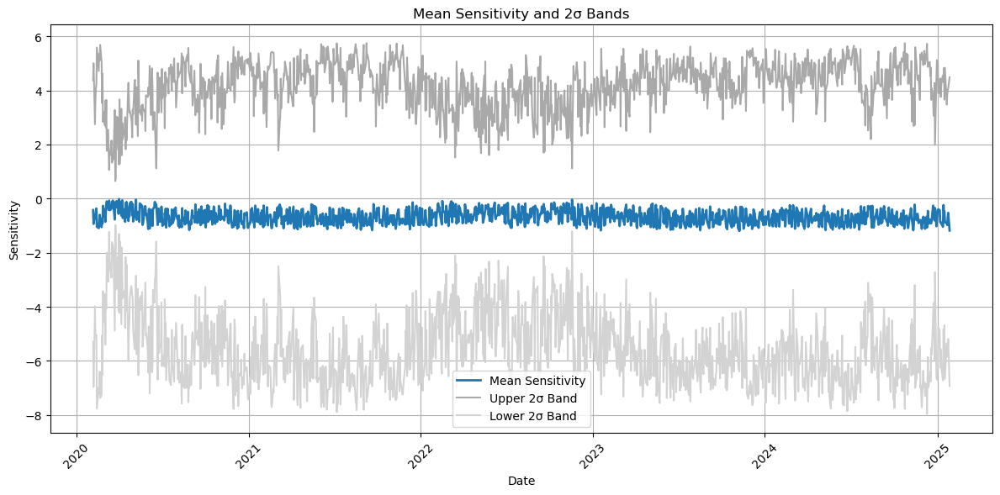

,0,1,2,3,4,5,6,7,8,9,...,93,94,95,96,97,98,99,Mean,Upper_2Sigma,Lower_2Sigma
Date,,,,,,,,,,,,,,,,,,,,,
2025-01-27,-4.774564,-4.334397,-0.492560,0.002052,-0.014879,-2.000011,-4.342345,2.093317,-2.440500,-0.076620,...,-2.146337,-0.889516,1.696063,1.485012,-6.261243,-0.688905,-0.867623,-1.179451,4.486524,-6.927874
2025-01-24,-1.762606,-1.588717,2.258311,-0.022802,1.694387,-1.219245,-3.494851,0.542558,-1.031815,-0.103114,...,-1.907578,-0.894576,-0.085973,1.757822,-3.993498,-0.638551,0.903424,-0.524979,4.069346,-5.186158
2025-01-23,-2.165304,-3.214890,0.272250,0.068113,1.184068,-0.853708,-3.486622,1.766838,-2.386292,-0.030494,...,-1.328870,-0.885555,2.147293,1.604487,-5.244879,-0.669570,-1.515430,-0.706929,4.035378,-5.518244
2025-01-22,-2.544378,-2.432802,0.946147,-0.016327,-0.854049,-2.253031,-2.915490,0.039088,-0.830162,-0.083618,...,-3.345623,-0.908083,1.147575,0.498823,-5.918407,-0.701990,-0.274053,-0.974469,3.821624,-5.840352
2025-01-21,-2.362020,-1.810245,-0.001499,0.013548,-0.130426,-1.993798,-2.296807,1.002239,-0.311613,-0.091744,...,-2.675581,-0.751890,-0.448492,1.157080,-6.842803,-0.681286,-0.618213,-0.906250,3.477278,-5.353565
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-02-12,-3.551496,-2.051023,0.995023,-0.071111,3.746847,-1.850983,-2.077400,0.946589,-0.454447,-0.120569,...,-1.778078,-0.883875,0.013672,2.091641,-3.220135,-0.657192,0.988830,-0.461502,4.077554,-5.066608
2020-02-11,-2.466013,-2.391965,0.926097,0.017998,1.211111,-2.151323,-3.165880,0.914817,-1.020787,-0.000287,...,-1.565640,-0.880772,0.604110,1.097188,-4.866482,-0.615539,0.007882,-0.683008,3.696111,-5.125850
2020-02-10,-1.646431,-2.378345,-2.021766,0.012976,2.012346,-2.020533,-2.370812,1.590155,-1.148409,-0.091639,...,0.270938,-0.657026,-0.414895,2.349762,-4.420480,-0.588389,0.689889,-0.586892,2.748505,-3.970823


In [235]:
plot_lpd_mean_and_bands(lpd_sp500_5y_specific_lag)

# Stock(s) Analysis with LPD (Multiple Lags) - Using LSTM

## Creation LPD & Plots

In [110]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.optimizers import Adam

def calculate_lpd_lstm_by_lag(inputs, outputs, dates, individual_plots=False):
    """
    Calculate the Linear Parameter Data (LPD) for each lag using an LSTM and visualize neuron sensitivities over time.

    Parameters:
        inputs (np.ndarray): Input features (lagged features), shape (n_samples, n_timesteps, n_features).
        outputs (np.ndarray): Output values, shape (n_samples,).
        dates (pd.Index or pd.Series): The dates corresponding to each row in `inputs`.
        individual_plots (bool): If True, create individual plots for each lag.

    Returns:
        pd.DataFrame: LPD matrix containing contributions for each lag over time, including the "Date" column.
    """
    # Ensure the length of dates matches the number of rows in inputs/outputs
    if len(dates) != len(outputs):
        raise ValueError("The length of 'dates' must match the number of rows in 'inputs' and 'outputs'.")

    # Define and train the LSTM model
    n_timesteps, n_features = inputs.shape[1], inputs.shape[2]
    model = Sequential([
        LSTM(50, activation='tanh', input_shape=(n_timesteps, n_features), return_sequences=False),
        Dense(1)
    ])
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mse')

    # Train the model
    model.fit(inputs, outputs, epochs=50, batch_size=32, verbose=0)

    # Extract the weights and biases from the LSTM layer
    lstm_layer = model.layers[0]
    lstm_weights = lstm_layer.get_weights()

    # Calculate the LPD for each time step
    lpd_data = []
    for i in range(len(outputs)):
        x = inputs[i:i+1]  # Input for the current time step, shape (1, n_timesteps, n_features)

        # Get the output prediction
        predicted_output = model.predict(x, verbose=0)[0, 0]

        # Calculate contributions (approximation via LSTM weights and activations)
        contributions = []
        for lag in range(n_features):
            contribution = np.sum(x[0, :, lag] * lstm_weights[0][:, lag])  # Weighted sum of lagged inputs
            contributions.append(contribution)

        # Combine intercept and contributions
        intercept = predicted_output - np.sum(contributions)
        lpd_data.append([intercept] + contributions)

    # Convert to DataFrame
    columns = ["Intercept"] + [f"Lag_{i+1}" for i in range(n_features)]
    lpd_df = pd.DataFrame(lpd_data, columns=columns)

    # Add the "Date" column from the provided dates
    lpd_df["Date"] = dates

    # Extract sensitivity data (drop intercept and keep "Date" as the index)
    sensitivities = lpd_df.drop(columns=["Intercept"]).set_index("Date")

    # Assign colors for each lag
    colors = plt.cm.tab10.colors[:n_features]

    # Plot each neuron's sensitivity over time in a combined plot
    plt.figure(figsize=(12, 6))
    for i, neuron in enumerate(sensitivities.columns):
        plt.plot(sensitivities.index, sensitivities[neuron], label=neuron, color=colors[i])

        # Get the highest and lowest sensitivity values
        max_idx = sensitivities[neuron].idxmax()
        min_idx = sensitivities[neuron].idxmin()
        max_val = sensitivities[neuron].max()
        min_val = sensitivities[neuron].min()

        # Add labels for the highest and lowest points
        plt.text(max_idx, max_val, f"{max_val:.2f}", color=colors[i], fontsize=8)
        plt.text(min_idx, min_val, f"{min_val:.2f}", color=colors[i], fontsize=8)

    # Customize the plot
    plt.title("Sensitivities Over Time")
    plt.xlabel("Date")
    plt.ylabel("Sensitivity")
    plt.legend()
    plt.grid(True)

    # Rotate the x-axis labels for better readability
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    # Create individual plots for each lag if `individual_plots` is True
    if individual_plots:
        rows = (n_features + 1) // 2  # Calculate number of rows (2 plots per row)
        fig, axes = plt.subplots(rows, 2, figsize=(12, rows * 4))
        axes = axes.flatten()  # Flatten to handle indexing easily

        for i, neuron in enumerate(sensitivities.columns):
            ax = axes[i]
            ax.plot(sensitivities.index, sensitivities[neuron], label=neuron, color=colors[i])
            ax.set_title(f"Sensitivity Over Time for {neuron}")
            ax.set_xlabel("Date")
            ax.set_ylabel("Sensitivity")
            ax.grid(True)
            ax.legend()
            ax.tick_params(axis='x', rotation=45)

        # Hide any unused subplots
        for j in range(i + 1, len(axes)):
            axes[j].axis('off')

        plt.tight_layout()
        plt.show()

    return lpd_df


### Creation LPD (3 lags)

First, we will focus on creating an analysis for a LPD matrix which is based upon 3 lags, meaning that we look back three days in the past to assess our future price prediction. However, for analysis purposes, this is not the best \# of lags, hence the reason we only conduct this analysis for the S&P500 index.

### **S&P500**

#### 1-year S&P500

/opt/anaconda3/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


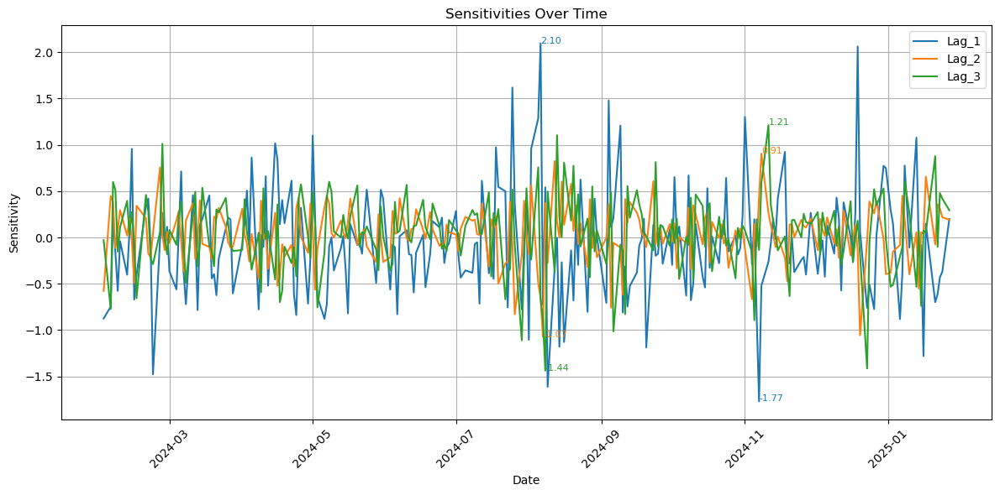

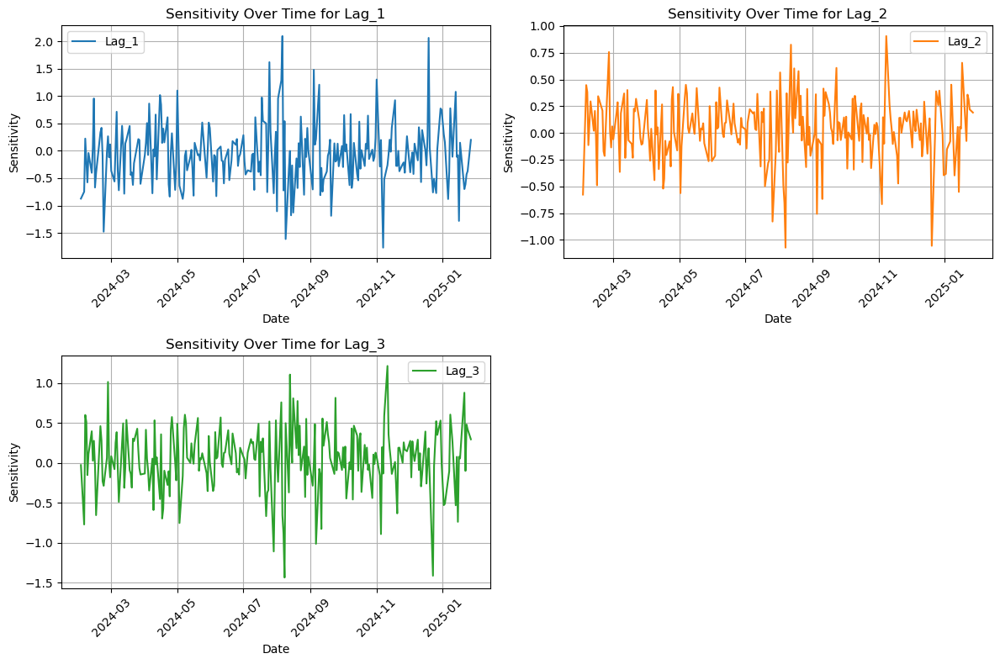

,Intercept,Lag_1,Lag_2,Lag_3,Date
Date,,,,,
2025-01-27,-0.697179,0.199699,0.190256,0.294305,2025-01-27
2025-01-24,-0.157091,-0.371646,0.219777,0.420423,2025-01-24
2025-01-23,-0.221143,-0.429312,0.313958,0.479055,2025-01-23
2025-01-22,0.449755,-0.613284,0.357743,-0.101300,2025-01-22
2025-01-21,0.179716,-0.698814,-0.075648,0.878069,2025-01-21
...,...,...,...,...,...
2024-02-08,0.749186,-0.576440,0.082727,-0.152780,2024-02-08
2024-02-07,-0.167178,-0.161599,-0.114091,0.512302,2024-02-07
2024-02-06,-1.211243,0.222865,0.382571,0.599053,2024-02-06


In [115]:
# Generate lagged features
lags = 3  # Number of lags to include
lagged_data = create_lag_features(sp500_data_1y, lags)

# Prepare inputs, outputs, and dates
inputs = lagged_data[[f't-{i}' for i in range(1, lags + 1)]].values  # All lag features (X)
outputs = lagged_data['t'].values  # Target variable (y)
dates = lagged_data.index  # Dates corresponding to the rows

# Reshape inputs for LSTM (LSTM expects 3D inputs: samples, timesteps, features)
n_samples = inputs.shape[0]
n_features = lags  # Each lag corresponds to a feature
inputs_lstm = inputs.reshape((n_samples, 1, n_features))  # Reshape for single timestep per sample

# Calculate LPD matrix using the LSTM function
lpd_sp500_1y_multiple_lags = calculate_lpd_lstm_by_lag(inputs_lstm, outputs, dates, True)

# Set index of the resulting DataFrame to match the lagged_data index
lpd_sp500_1y_multiple_lags.index = lagged_data.index

# Display the LPD matrix
lpd_sp500_1y_multiple_lags

#### 5-year S&P500

MLP treats all input features (`t-1`, `t-2`, `t-3`) as independent and doesn't consider temporal relationships between them. LSTM, on the other hand, is designed to capture temporal dependencies across sequences. The `n_features` are treated as input features at that timestep.

Unlike an MLP, LSTMs expect a 3D input tensor of shape (`n_samples`, `n_timesteps`, `n_features`). Since we are using single-lagged features per sample, we reshape inputs to include a single timestep per sample: (`n_samples`, `1`, `n_features`). The LPD matrix (`lpd_sp500_1y_multiple_lags`) will show:
- A column for the intercept.
- Contributions of each lagged feature (`Lag_1`, `Lag_2`, etc.) for each date in the dataset.

/opt/anaconda3/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


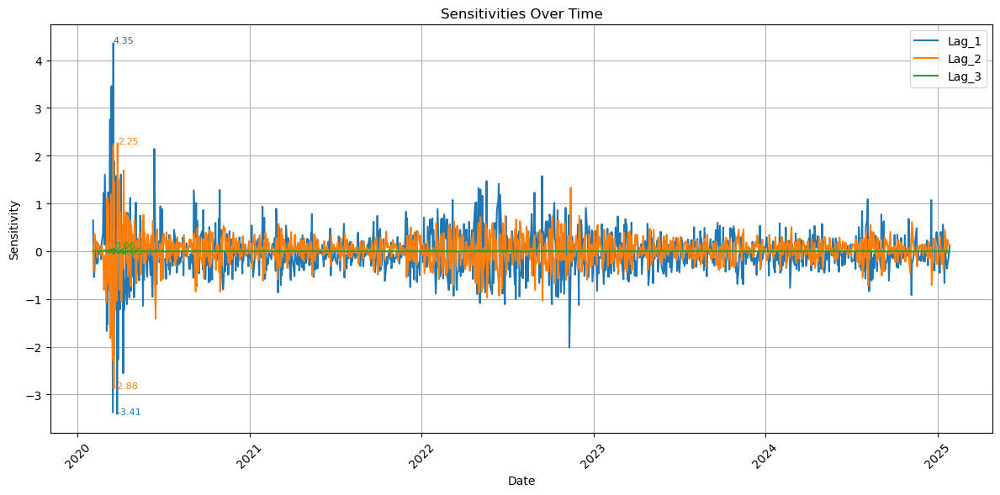

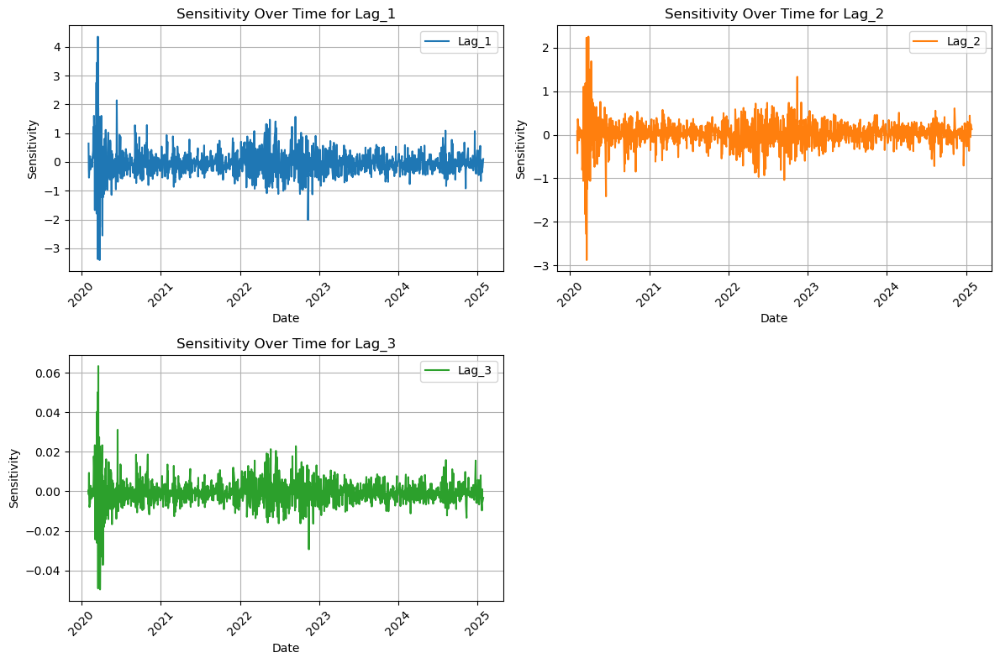

,Intercept,Lag_1,Lag_2,Lag_3,Date
Date,,,,,
2025-01-27,-0.249258,0.103741,0.127617,-0.003247,2025-01-27
2025-01-24,0.089258,-0.193066,0.147419,-0.004638,2025-01-24
2025-01-23,0.061556,-0.223022,0.210592,-0.005285,2025-01-23
2025-01-22,0.223994,-0.318594,0.239962,0.001118,2025-01-22
2025-01-21,0.402363,-0.363025,-0.050742,-0.009687,2025-01-21
...,...,...,...,...,...
2020-02-07,-0.168166,-0.120838,0.270213,-0.007924,2020-02-07
2020-02-06,0.222316,-0.408791,0.359794,-0.003838,2020-02-06
2020-02-05,0.475375,-0.544314,0.174239,0.009366,2020-02-05


In [118]:
# Generate lagged features
lags = 3  # Number of lags to include
lagged_data = create_lag_features(sp500_data_5y, lags)

# Prepare inputs, outputs, and dates
inputs = lagged_data[[f't-{i}' for i in range(1, lags + 1)]].values  # All lag features (X)
outputs = lagged_data['t'].values  # Target variable (y)
dates = lagged_data.index  # Dates corresponding to the rows

# Reshape inputs for LSTM (LSTM expects 3D inputs: samples, timesteps, features)
n_samples = inputs.shape[0]
n_features = lags  # Each lag corresponds to a feature
inputs_lstm = inputs.reshape((n_samples, 1, n_features))  # Reshape for single timestep per sample

# Calculate LPD matrix using the LSTM function
lpd_sp500_1y_multiple_lags = calculate_lpd_lstm_by_lag(inputs_lstm, outputs, dates, True)

# Set index of the resulting DataFrame to match the lagged_data index
lpd_sp500_1y_multiple_lags.index = lagged_data.index

# Display the LPD matrix
lpd_sp500_1y_multiple_lags

### Creation LPD (6 lags)

Now, we will focus on creating an analysis for a LPD matrix which is based upon 6 lags, meaning that we look back six days in the past to assess our future price prediction. This will mean more features and thus more potential insights.

### **S&P500**

#### 1-year S&P500

/opt/anaconda3/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


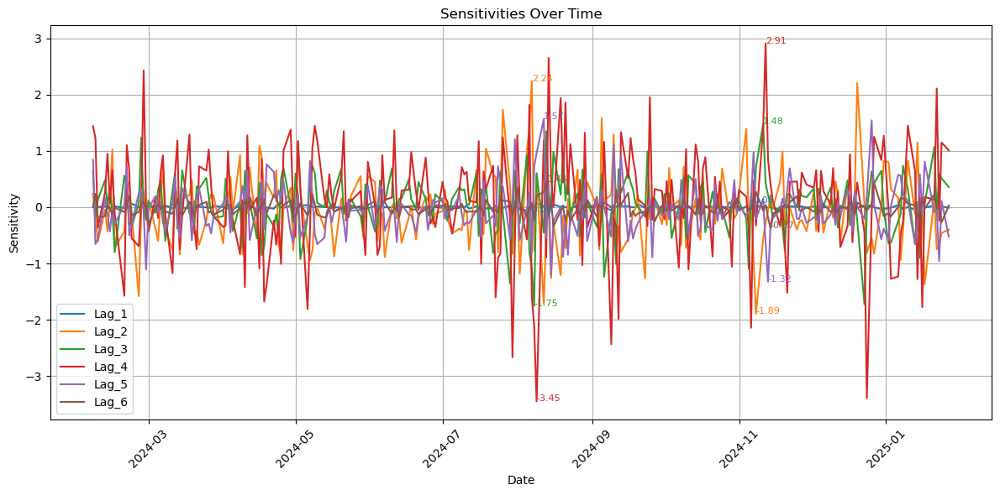

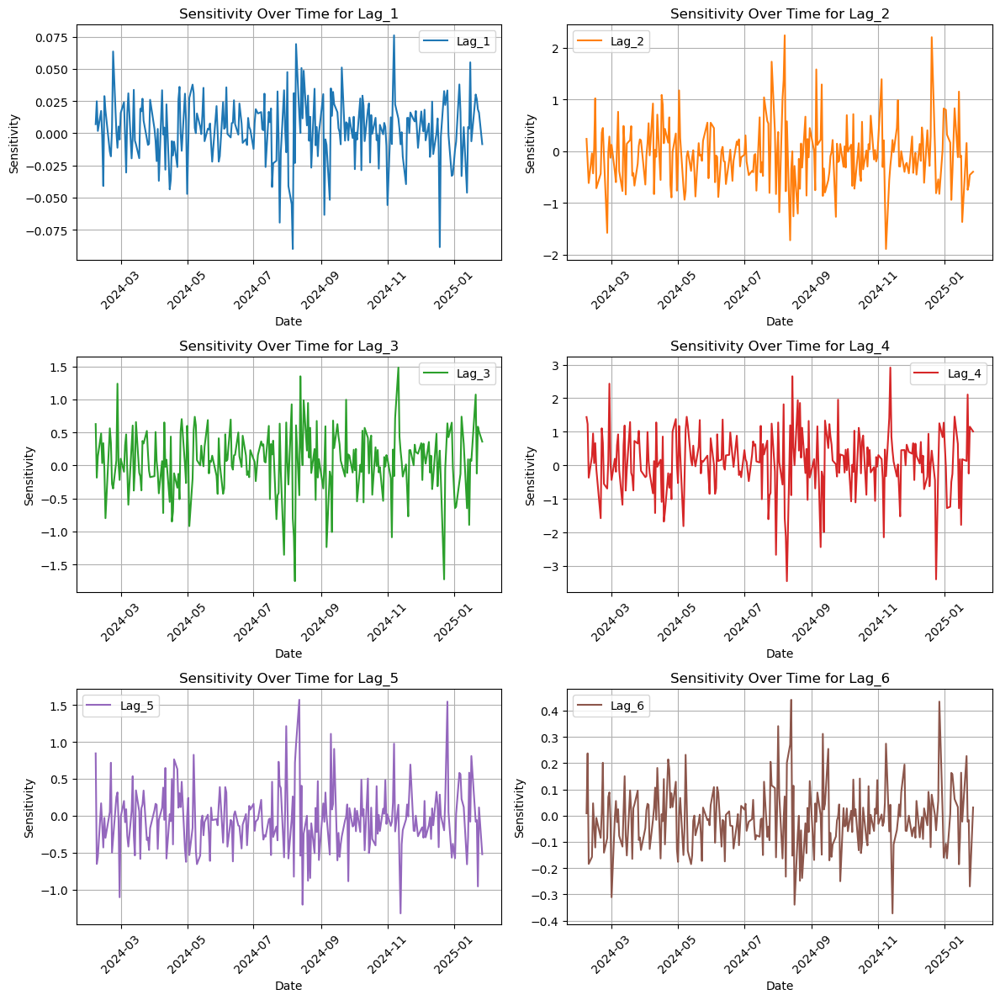

,Intercept,Lag_1,Lag_2,Lag_3,Lag_4,Lag_5,Lag_6,Date
Date,,,,,,,,
2025-01-27,-0.526202,-0.008579,-0.397666,0.359401,1.010062,-0.523241,0.031127,2025-01-27
2025-01-24,-0.919810,0.015966,-0.459369,0.513415,1.150927,0.110644,-0.269807,2025-01-24
2025-01-23,1.231284,0.018443,-0.656222,0.585016,-0.243373,-0.959058,-0.016888,2025-01-23
2025-01-22,-1.089922,0.026346,-0.747740,-0.123706,2.109556,-0.060032,-0.023211,2025-01-22
2025-01-21,-1.371331,0.030021,0.158116,1.072287,0.132047,-0.082507,0.227064,2025-01-21
...,...,...,...,...,...,...,...,...
2024-02-13,-0.463958,-0.002851,-0.429762,0.033410,0.949381,-0.120998,0.046945,2024-02-13
2024-02-12,-0.655058,0.017254,-0.042703,0.482570,0.266149,0.166871,-0.157417,2024-02-12
2024-02-09,1.503004,0.001714,-0.616798,0.135284,-0.367053,-0.559554,-0.184073,2024-02-09


In [123]:
# Generate lagged features
lags = 6  # Number of lags to include
lagged_data = create_lag_features(sp500_data_1y, lags)

# Prepare inputs, outputs, and dates
inputs = lagged_data[[f't-{i}' for i in range(1, lags + 1)]].values  # All lag features (X)
outputs = lagged_data['t'].values  # Target variable (y)
dates = lagged_data.index  # Dates corresponding to the rows

# Reshape inputs for LSTM (LSTM expects 3D inputs: samples, timesteps, features)
n_samples = inputs.shape[0]
n_features = lags  # Each lag corresponds to a feature
inputs_lstm = inputs.reshape((n_samples, 1, n_features))  # Reshape for single timestep per sample

# Calculate LPD matrix using the LSTM function
lpd_sp500_1y_multiple_lags = calculate_lpd_lstm_by_lag(inputs_lstm, outputs, dates, True)

# Set index of the resulting DataFrame to match the lagged_data index
lpd_sp500_1y_multiple_lags.index = lagged_data.index

# Display the LPD matrix
lpd_sp500_1y_multiple_lags

#### 5-year S&P500

/opt/anaconda3/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


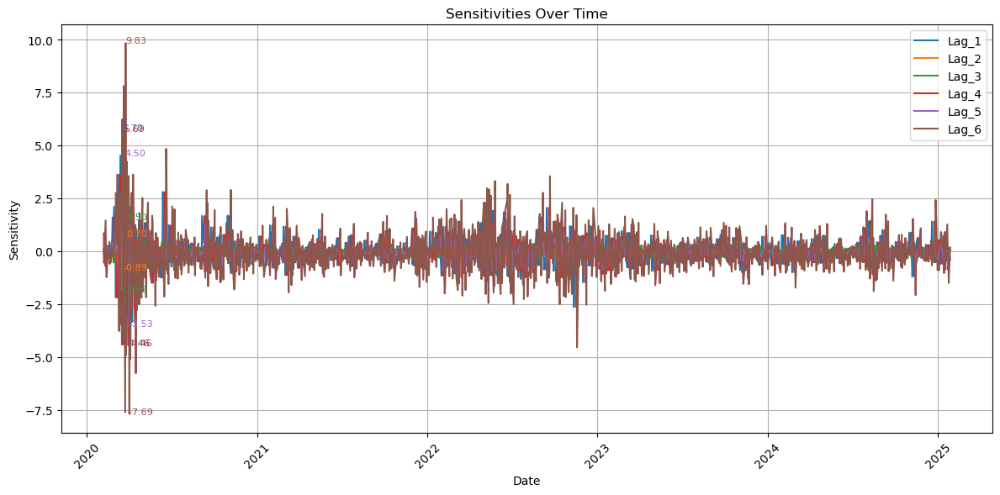

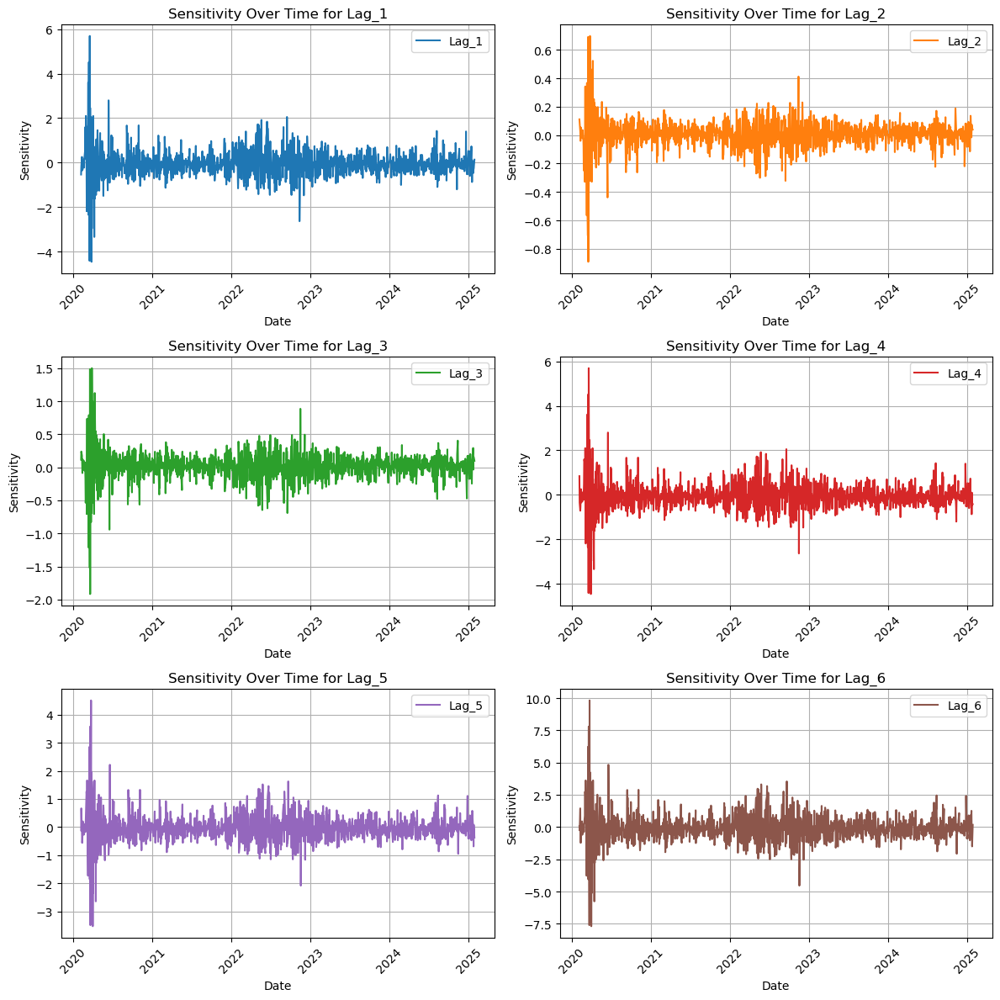

,Intercept,Lag_1,Lag_2,Lag_3,Lag_4,Lag_5,Lag_6,Date
Date,,,,,,,,
2025-01-27,0.308028,0.135687,0.039502,0.098180,-0.416464,-0.375541,0.173227,2025-01-27
2025-01-24,1.912208,-0.252518,0.045631,0.140253,-0.474545,0.079411,-1.501536,2025-01-24
2025-01-23,0.725637,-0.291700,0.065186,0.159813,0.100346,-0.688336,-0.093988,2025-01-23
2025-01-22,1.455422,-0.416702,0.074277,-0.033794,-0.869801,-0.043086,-0.129177,2025-01-22
2025-01-21,-1.002294,-0.474816,-0.015706,0.292923,-0.054445,-0.059217,1.263659,2025-01-21
...,...,...,...,...,...,...,...,...
2020-02-12,2.004614,-0.080243,0.054467,-0.086390,-0.157959,-0.422884,-1.228301,2020-02-12
2020-02-11,2.014865,-0.348180,-0.040152,0.053196,-0.534369,-0.563079,-0.594833,2020-02-11
2020-02-10,-0.789837,0.256670,0.024724,0.179960,-0.711524,-0.272684,1.451768,2020-02-10


In [180]:
# Generate lagged features
lags = 6  # Number of lags to include
lagged_data = create_lag_features(sp500_data_5y, lags)

# Prepare inputs, outputs, and dates
inputs = lagged_data[[f't-{i}' for i in range(1, lags + 1)]].values  # All lag features (X)
outputs = lagged_data['t'].values  # Target variable (y)
dates = lagged_data.index  # Dates corresponding to the rows

# Reshape inputs for LSTM (LSTM expects 3D inputs: samples, timesteps, features)
n_samples = inputs.shape[0]
n_features = lags  # Each lag corresponds to a feature
inputs_lstm = inputs.reshape((n_samples, 1, n_features))  # Reshape for single timestep per sample

# Calculate LPD matrix using the LSTM function
lpd_sp500_1y_multiple_lags = calculate_lpd_lstm_by_lag(inputs_lstm, outputs, dates, True)

# Set index of the resulting DataFrame to match the lagged_data index
lpd_sp500_1y_multiple_lags.index = lagged_data.index

# Display the LPD matrix
lpd_sp500_1y_multiple_lags

# Stock(s) Analysis with LPD (Single Lag) - Using LSTM

## Creation LPD & Plots

In [184]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.optimizers import Adam

def calculate_lpd_for_specific_lag_lstm(inputs, outputs, dates, lag_number, n_runs=10):
    """
    Calculate the Linear Parameter Data (LPD) for a specific lag using an LSTM and visualize the outcomes of multiple runs.

    Parameters:
        inputs (np.ndarray): Input features (lagged features), shape (n_samples, n_timesteps, n_features).
        outputs (np.ndarray): Output values, shape (n_samples,).
        dates (pd.Index or pd.Series): The dates corresponding to each row in `inputs`.
        lag_number (int): The lag number to assess (1-indexed).
        n_runs (int): The number of times to run the LSTM.

    Returns:
        pd.DataFrame: A DataFrame containing the sensitivity results for the specified lag across multiple runs.
    """
    # Ensure the lag_number is valid
    if lag_number < 1 or lag_number > inputs.shape[2]:
        raise ValueError(f"Lag number must be between 1 and {inputs.shape[2]}.")

    # Ensure the length of dates matches the number of rows in inputs/outputs
    if len(dates) != len(outputs):
        raise ValueError("The length of 'dates' must match the number of rows in 'inputs' and 'outputs'.")

    # Store results for each run
    sensitivities = []

    for run in range(n_runs):
        # Define and train the LSTM model
        model = Sequential([
            LSTM(50, activation='tanh', input_shape=(inputs.shape[1], inputs.shape[2]), return_sequences=False),
            Dense(1)
        ])
        model.compile(optimizer=Adam(learning_rate=0.001), loss='mse')
        model.fit(inputs, outputs, epochs=50, batch_size=32, verbose=0)

        # Extract weights from the LSTM layer
        lstm_layer = model.layers[0]
        lstm_weights = lstm_layer.get_weights()
        lag_weights = lstm_weights[0][:, lag_number - 1]  # Extract weights for the specified lag

        # Calculate sensitivities for the specified lag
        lag_sensitivities = []
        for i in range(len(outputs)):
            x = inputs[i:i+1]  # Input for the current time step

            # Get the LSTM output prediction
            predicted_output = model.predict(x, verbose=0)[0, 0]

            # Contribution for the specified lag
            sensitivity = np.sum(x[0, :, lag_number - 1] * lag_weights)
            lag_sensitivities.append(sensitivity)

        sensitivities.append(lag_sensitivities)

    # Convert sensitivities to DataFrame
    sensitivity_df = pd.DataFrame(sensitivities).T  # Transpose to have time steps as rows
    sensitivity_df["Date"] = dates

    # Plot sensitivities across runs
    plt.figure(figsize=(12, 6))
    for run in range(n_runs):
        plt.plot(sensitivity_df["Date"], sensitivity_df[run], label=f"Run {run + 1}")

    # Customize the plot
    plt.title(f"Sensitivities for Lag {lag_number} Across {n_runs} Runs (LSTM)")
    plt.xlabel("Date")
    plt.ylabel("Sensitivity")
    # plt.legend()  # Uncomment if you want the legend
    plt.grid(True)

    # Rotate the x-axis labels for better readability
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    return sensitivity_df


### Creation LPD for 6th Lag

### **S&P500**

#### 1-year S&P500

/opt/anaconda3/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


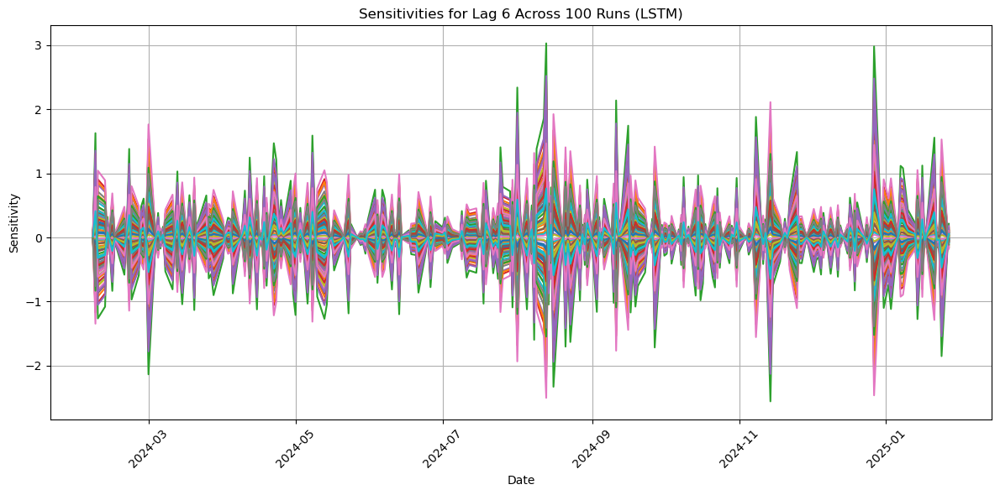

,0,1,2,3,4,5,6,7,8,9,...,91,92,93,94,95,96,97,98,99,Date
Date,,,,,,,,,,,,,,,,,,,,,
2025-01-27,0.027779,0.138943,0.007243,-0.029207,-0.065648,-0.026671,-0.049528,0.108320,0.049025,-0.092411,...,0.107753,-0.108967,0.073584,0.143277,-0.035019,0.103388,-0.099353,0.028089,0.053912,2025-01-27
2025-01-24,-0.240787,-1.204356,-0.062783,0.253165,0.569039,0.231182,0.429312,-0.938916,-0.424951,0.801022,...,-0.934000,0.944528,-0.637825,-1.241923,0.303546,-0.896167,0.861188,-0.243480,-0.467312,2025-01-24
2025-01-23,-0.015072,-0.075386,-0.003930,0.015847,0.035619,0.014471,0.026873,-0.058771,-0.026600,0.050140,...,-0.058463,0.059122,-0.039924,-0.077738,0.019000,-0.056095,0.053906,-0.015240,-0.029251,2025-01-23
2025-01-22,-0.020715,-0.103610,-0.005401,0.021780,0.048954,0.019889,0.036934,-0.080775,-0.036558,0.068912,...,-0.080352,0.081257,-0.054872,-0.106842,0.026114,-0.077097,0.074088,-0.020946,-0.040203,2025-01-22
2025-01-21,0.202641,1.013560,0.052837,-0.213058,-0.478891,-0.194558,-0.361300,0.790171,0.357629,-0.674123,...,0.786034,-0.794894,0.536780,1.045175,-0.255457,0.754195,-0.724757,0.204907,0.393279,2025-01-21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-02-13,0.041896,0.209552,0.010924,-0.044050,-0.099010,-0.040225,-0.074698,0.163367,0.073939,-0.139374,...,0.162511,-0.164343,0.110979,0.216089,-0.052815,0.155929,-0.149843,0.042364,0.081310,2024-02-13
2024-02-12,-0.140485,-0.702672,-0.036630,0.147707,0.332001,0.134882,0.250479,-0.547803,-0.247934,0.467350,...,-0.544935,0.551077,-0.372134,-0.724590,0.177101,-0.522861,0.502453,-0.142056,-0.272649,2024-02-12
2024-02-09,-0.164274,-0.821658,-0.042833,0.172719,0.388220,0.157722,0.292893,-0.640565,-0.289918,0.546488,...,-0.637211,0.644393,-0.435149,-0.847288,0.207091,-0.611400,0.587535,-0.166111,-0.318818,2024-02-09


In [189]:
# Generate lagged features
lags = 6  # Number of lags to include
lagged_data = create_lag_features(sp500_data_1y, lags)

# Prepare inputs, outputs, and dates
inputs = lagged_data[[f't-{i}' for i in range(1, lags + 1)]].values  # All lag features (X)
outputs = lagged_data['t'].values  # Target variable (y)
dates = lagged_data.index  # Dates corresponding to the rows

# Reshape inputs for LSTM (LSTM expects 3D inputs: samples, timesteps, features)
n_samples = inputs.shape[0]
n_features = lags  # Each lag corresponds to a feature
inputs_lstm = inputs.reshape((n_samples, 1, n_features))  # Reshape for single timestep per sample

# Specify the lag to assess and number of runs
lag_number = 6
n_runs = 100

# Calculate LPD matrix using the LSTM function
lpd_sp500_1y_multiple_lags = calculate_lpd_for_specific_lag_lstm(inputs_lstm, outputs, dates, lag_number, n_runs)

# Set index of the resulting DataFrame to match the lagged_data index
lpd_sp500_1y_multiple_lags.index = lagged_data.index

# Display the LPD matrix
lpd_sp500_1y_multiple_lags

In [213]:
def plot_lpd_mean_and_bands(dataframe):
    """
    Compute and plot the mean sensitivity and the two-sigma upper and lower bands for the given dataset.

    Parameters:
        lpd_sp500_1y_multiple_lags (pd.DataFrame): A DataFrame containing multiple lag sensitivity values indexed by Date.
    """
    # Ensure the Date column is set as index
    if "Date" in dataframe.columns:
        dataframe = dataframe.set_index("Date")

    # Drop non-numeric columns if any
    numeric_df = dataframe.select_dtypes(include=[np.number])

    # Compute mean and 2σ bounds
    numeric_df["Mean"] = dataframe.mean(axis=1)
    numeric_df["Upper_2Sigma"] = numeric_df["Mean"] + 2 * numeric_df.std(axis=1)
    numeric_df["Lower_2Sigma"] = numeric_df["Mean"] - 2 * numeric_df.std(axis=1)

    # Plot mean and bands
    plt.figure(figsize=(12, 6))
    plt.plot(numeric_df.index, numeric_df["Mean"], label="Mean Sensitivity", linewidth=2)
    plt.plot(numeric_df.index, numeric_df["Upper_2Sigma"], label="Upper 2σ Band", linestyle="-", color='darkgrey')
    plt.plot(numeric_df.index, numeric_df["Lower_2Sigma"], label="Lower 2σ Band", linestyle="-", color='lightgrey')

    # Customize the plot
    plt.title("Mean Sensitivity and 2σ Bands")
    plt.xlabel("Date")
    plt.ylabel("Sensitivity")
    plt.legend()
    plt.grid(True)

    # Rotate x-axis labels for better readability
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    return numeric_df

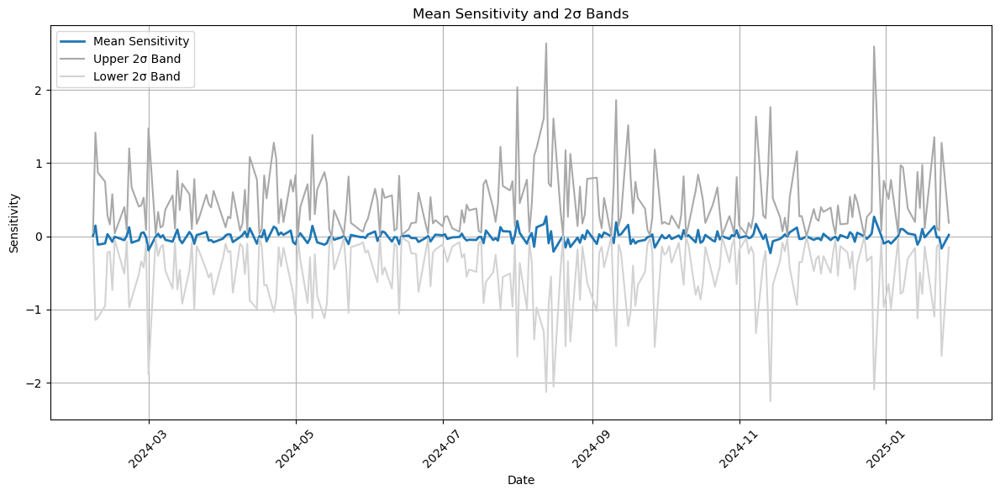

,0,1,2,3,4,5,6,7,8,9,...,93,94,95,96,97,98,99,Mean,Upper_2Sigma,Lower_2Sigma
Date,,,,,,,,,,,,,,,,,,,,,
2025-01-27,0.027779,0.138943,0.007243,-0.029207,-0.065648,-0.026671,-0.049528,0.108320,0.049025,-0.092411,...,0.073584,0.143277,-0.035019,0.103388,-0.099353,0.028089,0.053912,0.019165,0.185878,-0.149974
2025-01-24,-0.240787,-1.204356,-0.062783,0.253165,0.569039,0.231182,0.429312,-0.938916,-0.424951,0.801022,...,-0.637825,-1.241923,0.303546,-0.896167,0.861188,-0.243480,-0.467312,-0.166121,1.278945,-1.632215
2025-01-23,-0.015072,-0.075386,-0.003930,0.015847,0.035619,0.014471,0.026873,-0.058771,-0.026600,0.050140,...,-0.039924,-0.077738,0.019000,-0.056095,0.053906,-0.015240,-0.029251,-0.010398,0.080055,-0.102168
2025-01-22,-0.020715,-0.103610,-0.005401,0.021780,0.048954,0.019889,0.036934,-0.080775,-0.036558,0.068912,...,-0.054872,-0.106842,0.026114,-0.077097,0.074088,-0.020946,-0.040203,-0.014291,0.110027,-0.140419
2025-01-21,0.202641,1.013560,0.052837,-0.213058,-0.478891,-0.194558,-0.361300,0.790171,0.357629,-0.674123,...,0.536780,1.045175,-0.255457,0.754195,-0.724757,0.204907,0.393279,0.139804,1.355940,-1.094028
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-02-13,0.041896,0.209552,0.010924,-0.044050,-0.099010,-0.040225,-0.074698,0.163367,0.073939,-0.139374,...,0.110979,0.216089,-0.052815,0.155929,-0.149843,0.042364,0.081310,0.028904,0.280339,-0.226189
2024-02-12,-0.140485,-0.702672,-0.036630,0.147707,0.332001,0.134882,0.250479,-0.547803,-0.247934,0.467350,...,-0.372134,-0.724590,0.177101,-0.522861,0.502453,-0.142056,-0.272649,-0.096922,0.746190,-0.952302
2024-02-09,-0.164274,-0.821658,-0.042833,0.172719,0.388220,0.157722,0.292893,-0.640565,-0.289918,0.546488,...,-0.435149,-0.847288,0.207091,-0.611400,0.587535,-0.166111,-0.318818,-0.113334,0.872545,-1.113560


In [215]:
plot_lpd_mean_and_bands(lpd_sp500_1y_multiple_lags)

#### 5-year S&P500

/opt/anaconda3/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


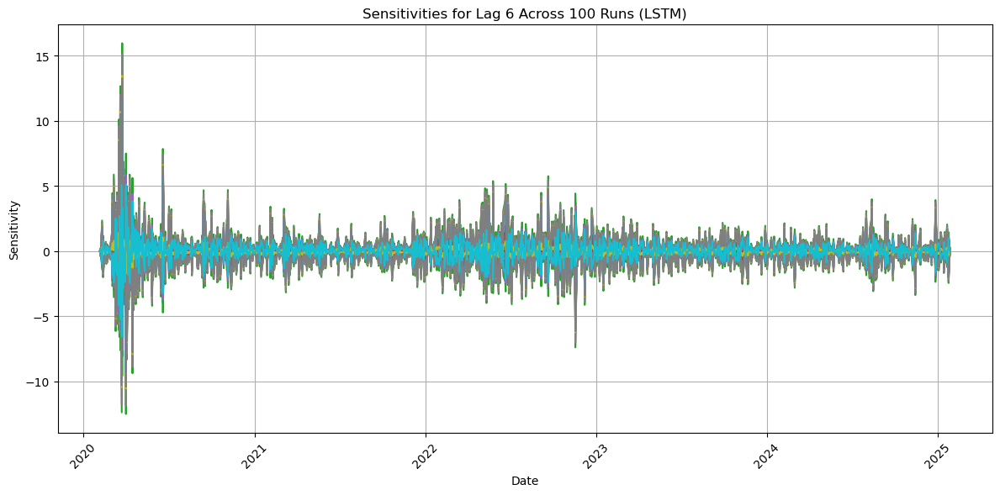

,0,1,2,3,4,5,6,7,8,9,...,91,92,93,94,95,96,97,98,99,Date
Date,,,,,,,,,,,,,,,,,,,,,
2025-01-27,0.006425,0.005689,0.048497,0.238570,0.173395,0.017596,0.212415,-0.014392,0.133692,-0.000211,...,0.071900,0.028893,0.002188,-0.132007,0.075824,0.040395,0.234029,0.038214,-0.115745,2025-01-27
2025-01-24,-0.055689,-0.049314,-0.420371,-2.067926,-1.502984,-0.152521,-1.841209,0.124753,-1.158841,0.001827,...,-0.623227,-0.250445,-0.018964,1.144233,-0.657246,-0.350148,-2.028561,-0.331243,1.003275,2025-01-24
2025-01-23,-0.003486,-0.003087,-0.026313,-0.129441,-0.094079,-0.009547,-0.115250,0.007809,-0.072537,0.000114,...,-0.039011,-0.015676,-0.001187,0.071623,-0.041140,-0.021917,-0.126977,-0.020734,0.062799,2025-01-23
2025-01-22,-0.004791,-0.004242,-0.036164,-0.177903,-0.129301,-0.013121,-0.158399,0.010732,-0.099695,0.000157,...,-0.053616,-0.021546,-0.001632,0.098438,-0.056543,-0.030123,-0.174517,-0.028497,0.086311,2025-01-22
2025-01-21,0.046867,0.041502,0.353775,1.740321,1.264879,0.128358,1.549521,-0.104989,0.975255,-0.001538,...,0.524494,0.210769,0.015960,-0.962962,0.553124,0.294677,1.707192,0.278767,-0.844334,2025-01-21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-02-12,-0.045556,-0.040341,-0.343876,-1.691626,-1.229486,-0.124766,-1.506164,0.102051,-0.947967,0.001495,...,-0.509818,-0.204872,-0.015514,0.936017,-0.537647,-0.286432,-1.659424,-0.270967,0.820709,2020-02-12
2020-02-11,-0.022061,-0.019536,-0.166530,-0.819209,-0.595407,-0.060421,-0.729395,0.049421,-0.459075,0.000724,...,-0.246891,-0.099214,-0.007513,0.453288,-0.260368,-0.138711,-0.803615,-0.131222,0.397447,2020-02-11
2020-02-10,0.053844,0.047680,0.406438,1.999385,1.453169,0.147465,1.780183,-0.120618,1.120431,-0.001767,...,0.602570,0.242144,0.018336,-1.106308,0.635462,0.338543,1.961325,0.320264,-0.970022,2020-02-10


In [218]:
# Generate lagged features
lags = 6  # Number of lags to include
lagged_data = create_lag_features(sp500_data_5y, lags)

# Prepare inputs, outputs, and dates
inputs = lagged_data[[f't-{i}' for i in range(1, lags + 1)]].values  # All lag features (X)
outputs = lagged_data['t'].values  # Target variable (y)
dates = lagged_data.index  # Dates corresponding to the rows

# Reshape inputs for LSTM (LSTM expects 3D inputs: samples, timesteps, features)
n_samples = inputs.shape[0]
n_features = lags  # Each lag corresponds to a feature
inputs_lstm = inputs.reshape((n_samples, 1, n_features))  # Reshape for single timestep per sample

# Specify the lag to assess and number of runs
lag_number = 6
n_runs = 100

# Calculate LPD matrix using the LSTM function
lpd_sp500_5y_multiple_lags = calculate_lpd_for_specific_lag_lstm(inputs_lstm, outputs, dates, lag_number, n_runs)

# Set index of the resulting DataFrame to match the lagged_data index
lpd_sp500_5y_multiple_lags.index = lagged_data.index

# Display the LPD matrix
lpd_sp500_5y_multiple_lags

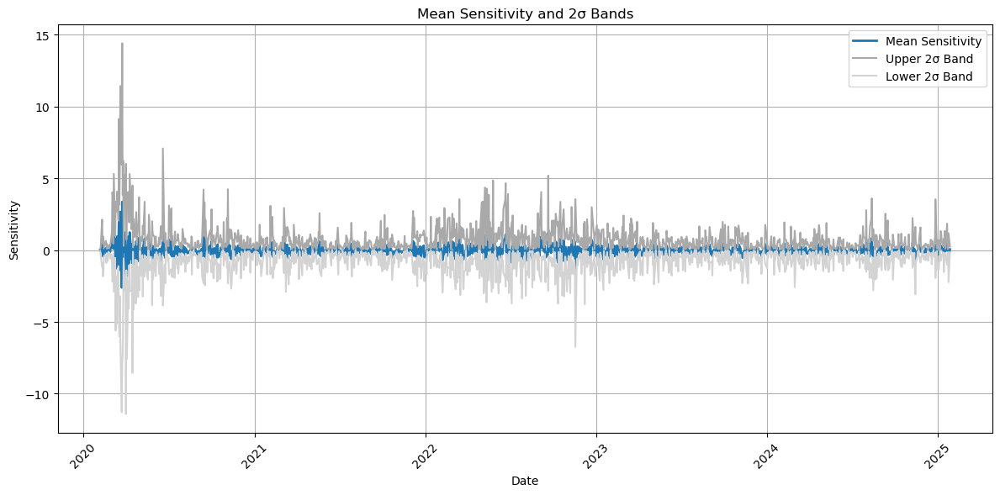

,0,1,2,3,4,5,6,7,8,9,...,93,94,95,96,97,98,99,Mean,Upper_2Sigma,Lower_2Sigma
Date,,,,,,,,,,,,,,,,,,,,,
2025-01-27,0.006425,0.005689,0.048497,0.238570,0.173395,0.017596,0.212415,-0.014392,0.133692,-0.000211,...,0.002188,-0.132007,0.075824,0.040395,0.234029,0.038214,-0.115745,0.059357,0.254192,-0.138312
2025-01-24,-0.055689,-0.049314,-0.420371,-2.067926,-1.502984,-0.152521,-1.841209,0.124753,-1.158841,0.001827,...,-0.018964,1.144233,-0.657246,-0.350148,-2.028561,-0.331243,1.003275,-0.514507,1.174317,-2.227907
2025-01-23,-0.003486,-0.003087,-0.026313,-0.129441,-0.094079,-0.009547,-0.115250,0.007809,-0.072537,0.000114,...,-0.001187,0.071623,-0.041140,-0.021917,-0.126977,-0.020734,0.062799,-0.032205,0.073506,-0.139455
2025-01-22,-0.004791,-0.004242,-0.036164,-0.177903,-0.129301,-0.013121,-0.158399,0.010732,-0.099695,0.000157,...,-0.001632,0.098438,-0.056543,-0.030123,-0.174517,-0.028497,0.086311,-0.044263,0.101026,-0.191666
2025-01-21,0.046867,0.041502,0.353775,1.740321,1.264879,0.128358,1.549521,-0.104989,0.975255,-0.001538,...,0.015960,-0.962962,0.553124,0.294677,1.707192,0.278767,-0.844334,0.432998,1.854276,-1.008961
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-02-12,-0.045556,-0.040341,-0.343876,-1.691626,-1.229486,-0.124766,-1.506164,0.102051,-0.947967,0.001495,...,-0.015514,0.936017,-0.537647,-0.286432,-1.659424,-0.270967,0.820709,-0.420882,0.960627,-1.822495
2020-02-11,-0.022061,-0.019536,-0.166530,-0.819209,-0.595407,-0.060421,-0.729395,0.049421,-0.459075,0.000724,...,-0.007513,0.453288,-0.260368,-0.138711,-0.803615,-0.131222,0.397447,-0.203822,0.465206,-0.882585
2020-02-10,0.053844,0.047680,0.406438,1.999385,1.453169,0.147465,1.780183,-0.120618,1.120431,-0.001767,...,0.018336,-1.106308,0.635462,0.338543,1.961325,0.320264,-0.970022,0.497454,2.130303,-1.159155


In [219]:
plot_lpd_mean_and_bands(lpd_sp500_5y_multiple_lags)